### AGN metrics

The AGN-specific metrics include 
 * a metric to calculate the number of QSO expected per sq degree (NQSO metric)
 * a metric to calculate the expected errors on the SF (AGN SFUncert metric)
 * a metric to calculate how well sampled various time lags will be (AGN TimeLags metric)
 
Demonstration notebooks for each of these metrics can be found in the [`rubin_sim_notebooks` repo](https://github.com/lsst/rubin_sim_notebooks/tree/main/maf/science), in the `maf/science` directory. 

In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import colorcet
import IPython

import rubin_sim.maf as maf

Here, we will look at some of the summary metrics calculated for these AGN metrics. 
While there are more summary metrics available, the subset pulled out are these:

In [3]:
metric_set = maf.get_metric_sets()
agn_sets = [m for m in metric_set.groupby('metric set').first().index if 'AGN' in m and 'DDF' not in m]
agn_sets

['AGN N QSO', 'AGN SF', 'AGN short', 'AGN timelag']

In [4]:
families = maf.get_family_descriptions()
summaries = maf.get_metric_summaries(summary_source='summary_2022_08_01.csv')

We can look at all of the metric outputs for all runs, but the result is hard to follow. So we'll look at the overall picture of things to identify interesting families of simulations (i.e. where the survey strategy impacts the metric results) and then look at those families in more detail. More information on the overall survey strategy variations and how these are implemented in various families is available in the [summary info](https://github.com/lsst-pst/survey_strategy/blob/main/fbs_2.0/SummaryInfo_v2.1.ipynb) notebook.

In [5]:
family_list = families.index.to_list()
family_list

['baseline',
 'rolling',
 'triplets',
 'long gaps no pairs',
 'bluer balance',
 'longer u visits',
 'vary nes',
 'vary gp',
 'galactic plane footprint',
 'vary expt',
 'good seeing',
 'microsurveys',
 'twilight neo 15s',
 'technical',
 'suppress repeats',
 'ddf percent',
 'ddf euclid moved',
 'ddf season length',
 'ddf double',
 'ddf quad',
 'ddf quad subfilter',
 'ddf bright',
 'ddf dither',
 'ddf roll',
 'ddf accordian',
 'ddf old rot',
 'ddf deep universal',
 'ddf deep rolling',
 'ddf early deep']

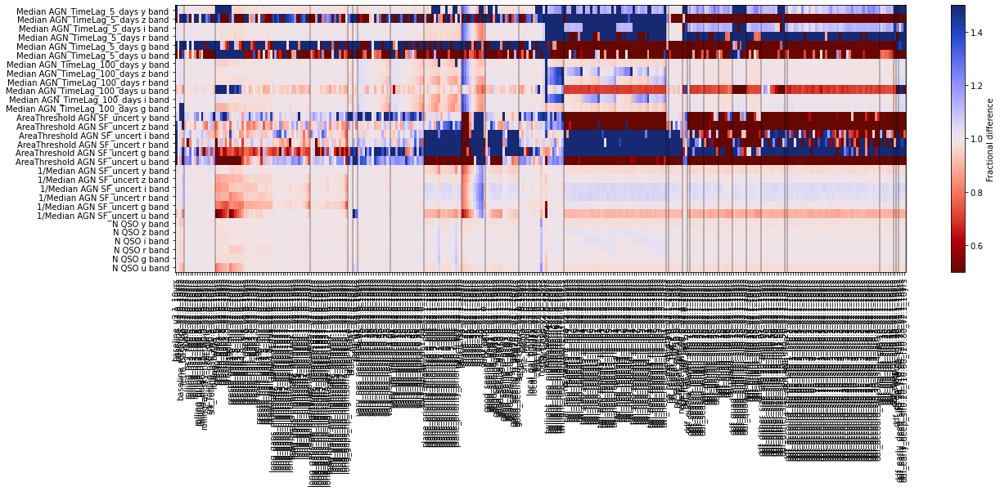

In [8]:
# All AGN metrics over all runs
these_runs = families.explode(['run']).loc[:]['run']
metrics = metric_set.loc[agn_sets].reset_index('metric set')
metrics.drop_duplicates(subset='metric', inplace=True)
baseline = 'baseline_v2.0_10yrs'

fig, ax = maf.plot_run_metric_mesh(summaries.loc[these_runs, metrics['metric']],
                                  baseline_run=baseline,
                                  metric_label_map=metrics['short_name'],
                                  metric_set=metrics)
fig.set_figwidth(20)
for l in maf.find_family_lines(families, family_list):
    ax.axvline(l, color='k', alpha=0.3)

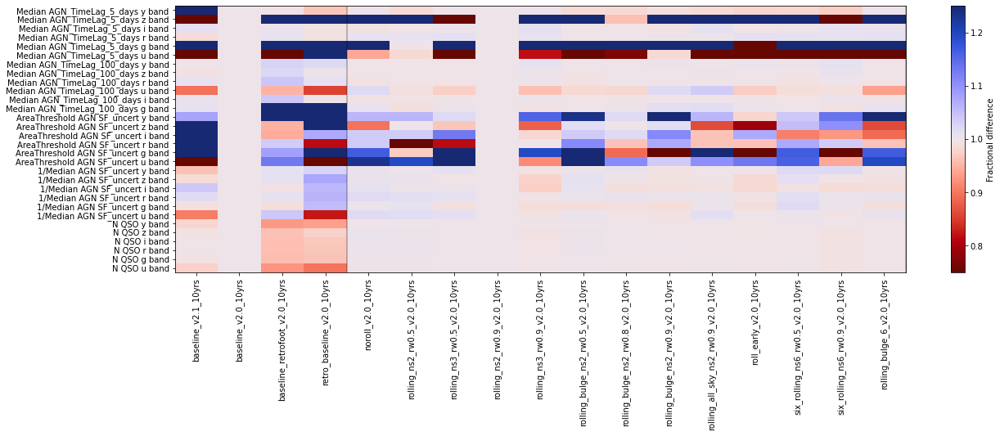

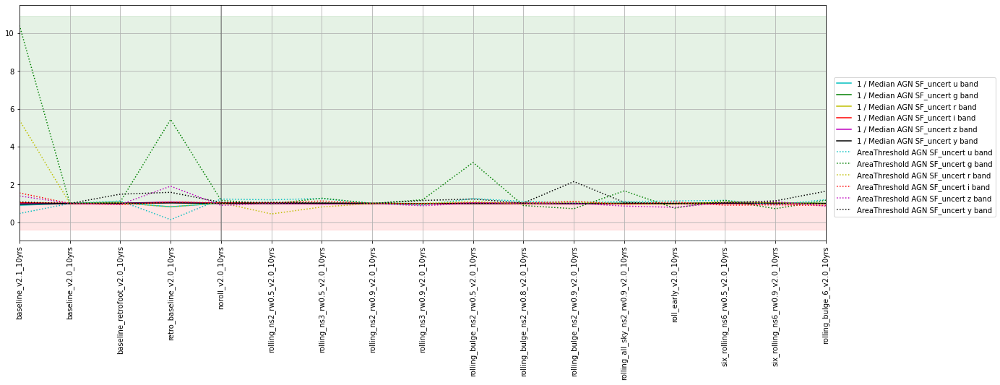

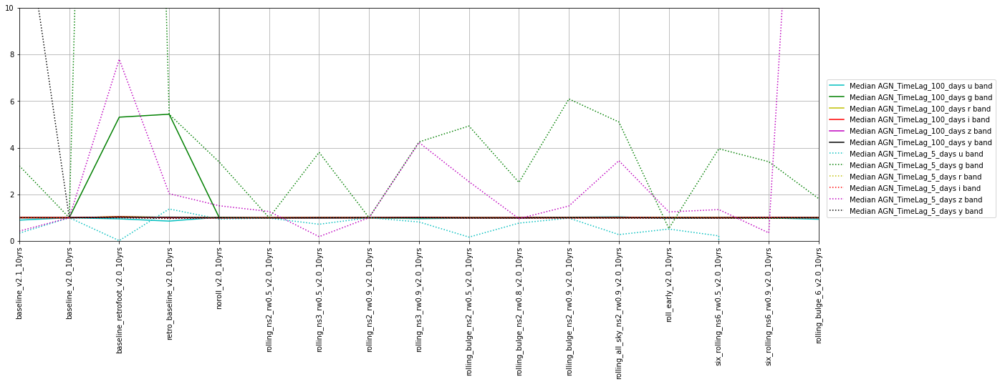

In [12]:
# All AGN metrics, a subset of runs which focus on seasonal-length cadence
fams = ['baseline', 'rolling']
these_runs = families.explode(['run']).loc[fams]['run']
baseline = families.loc['rolling']['reference']
lines = maf.find_family_lines(families, fams) 

fig, ax = maf.plot_run_metric_mesh(summaries.loc[these_runs, metrics['metric']],
                                  baseline_run=baseline,
                                  metric_label_map=metrics['short_name'],
                                  metric_set=metrics, 
                                  color_range=0.5)
fig.set_figwidth(20)
for l in lines:
    ax.axvline(l, color='k', alpha=0.3)
    
fig, ax = maf.plot_run_metric(summaries.loc[these_runs, metric_set.loc['AGN SF']['metric']],
                                  baseline_run=baseline,
                                  metric_label_map=metric_set.loc['AGN SF']['short_name'],
                                  metric_set=metric_set.loc['AGN SF'],
                             horizontal_quantity='run',
                             vertical_quantity='value')
fig.set_figwidth(20)
ax.legend(loc=(1.01, 0.1))
for l in lines:
    ax.axvline(l, color='k', alpha=0.3)
    
fig, ax = maf.plot_run_metric(summaries.loc[these_runs, metric_set.loc['AGN timelag']['metric']],
                                  baseline_run=baseline,
                                  metric_label_map=metric_set.loc['AGN timelag']['short_name'],
                                  metric_set=metric_set.loc['AGN timelag'],
                             horizontal_quantity='run',
                             vertical_quantity='value',
                             shade_fraction=0)
fig.set_figwidth(20)
ax.legend(loc=(1.01, 0.1))
ax.set_ylim(0, 10)
for l in lines:
    ax.axvline(l, color='k', alpha=0.3)

The change from the v1 footprint (baseline_retrofoot and retro_baseline) to the v2 footprint is generally good, in terms of number of QSO detected, but also to varying extents for the time dependent measurements like the AGN TimeLags. (the changes from baseline_v2.0 to baseline_v2.1 likely result from adding preferences for 'good seeing' images in v2.1, which slightly rearranges times of visits and single visit depths). 

The addition of rolling cadence is relatively neutral (see the 'noroll' run), as is the impact of rolling cadence in general. Strong rolling cadence in a larger number of bands (like "ns3" or "six" runs) gives slightly negative results, but nothing completely conclusive. 

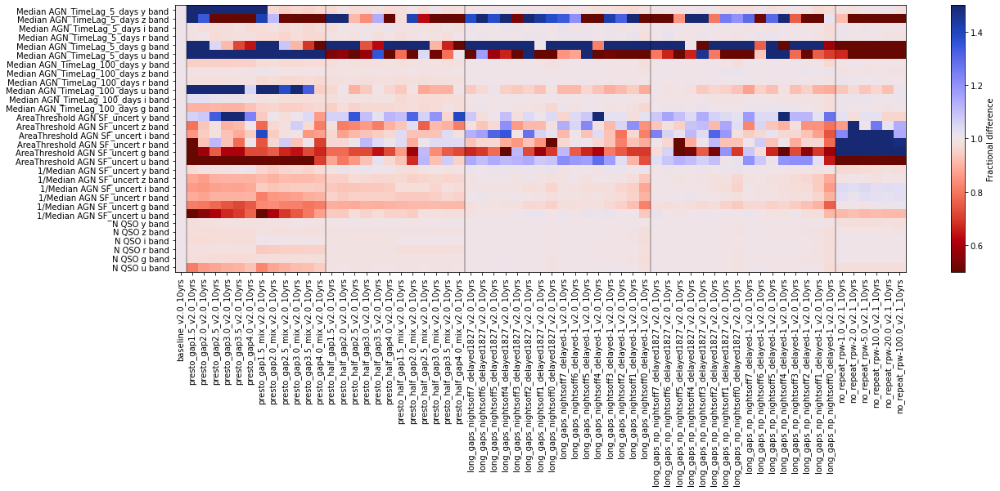

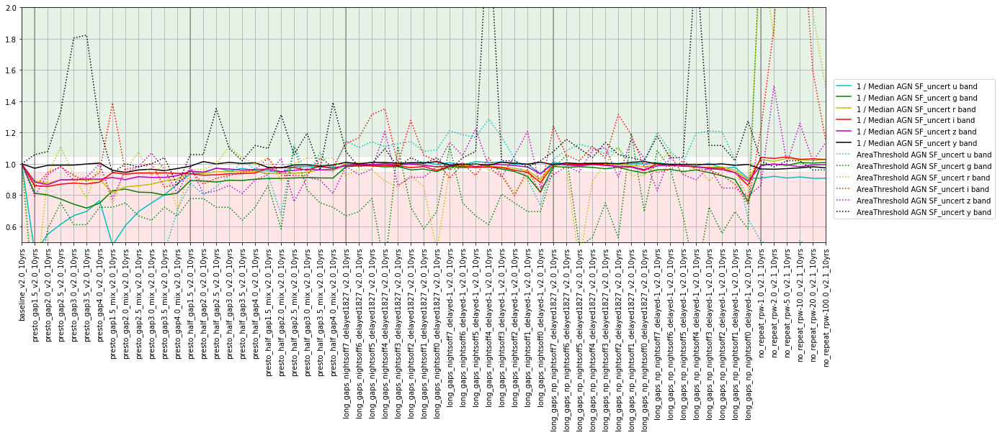

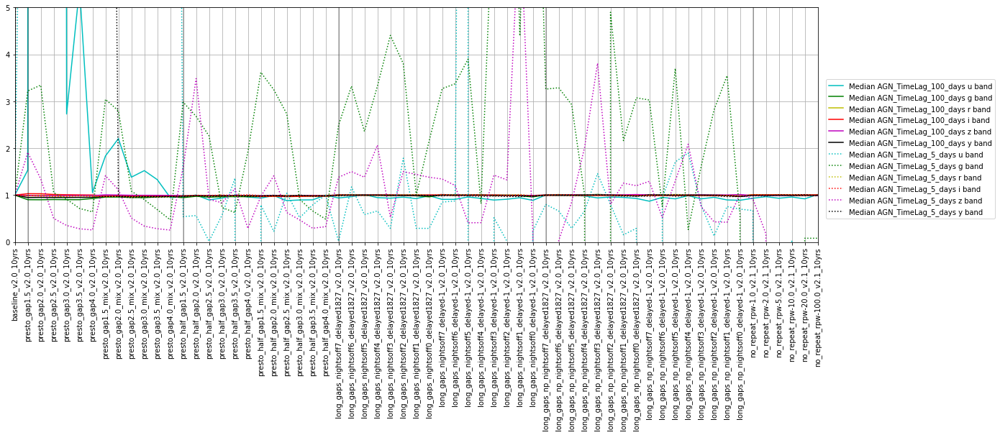

In [13]:
# all AGN metrics, intra-night cadence 
fams = ['triplets', 'long gaps no pairs', 'suppress repeats']
baseline = 'baseline_v2.0_10yrs'
these_runs = np.concatenate([[baseline], families.explode(['run']).loc[fams]['run']])

lines = [1,]
runs = list(these_runs)
lines += [len([r for r in runs if r.startswith('presto_gap')])]
lines += [len([r for r in runs if r.startswith('presto_half')])]
lines += [len([r for r in runs if r.startswith('long_gaps_nights')])]
lines += [len([r for r in runs if r.startswith('long_gaps_np')])]
lines = np.array(lines).cumsum()

fig, ax = maf.plot_run_metric_mesh(summaries.loc[these_runs, metrics['metric']],
                                  baseline_run=baseline,
                                  metric_label_map=metrics['short_name'],
                                  metric_set=metrics)
fig.set_figwidth(20)
for l in lines:
    ax.axvline(l, color='k', alpha=0.3)

fig, ax = maf.plot_run_metric(summaries.loc[these_runs, metric_set.loc['AGN SF']['metric']],
                                  baseline_run=baseline,
                                  metric_label_map=metric_set.loc['AGN SF']['short_name'],
                                  metric_set=metric_set.loc['AGN SF'],
                             horizontal_quantity='run',
                             vertical_quantity='value')
fig.set_figwidth(20)
ax.legend(loc=(1.01, 0.1))
for l in lines:
    ax.axvline(l, color='k', alpha=0.3)
ax.set_ylim(0.5, 2)
    
    
fig, ax = maf.plot_run_metric(summaries.loc[these_runs, metric_set.loc['AGN timelag']['metric']],
                                  baseline_run=baseline,
                                  metric_label_map=metric_set.loc['AGN timelag']['short_name'],
                                  metric_set=metric_set.loc['AGN timelag'],
                             horizontal_quantity='run',
                             vertical_quantity='value',
                             shade_fraction=0)
fig.set_figwidth(20)
ax.legend(loc=(1.01, 0.1))
ax.set_ylim(0, 5)
for l in lines:
    ax.axvline(l, color='k', alpha=0.3)

The families in the triplet series shows negative impacts to AGN SF uncertainty metrics, most strongly in the amount of area that reaches a threshold of SF uncertainty = 0.25.  This is linked to how often a triplet occurs, rather than just a pair of visits occurs in each night. None of these families attempts to take triplets for all images -- typically the first or first few "blobs" of pairs will get a triplet, if the interval is short. The 'presto_gap' family takes triplets at a variety of intervals every night; the 'presto_half' takes triplets every other night. The 'long gaps' takes triplets for the first blob of the night every 'nightsoff' - as these become more common (e.g. nightsoff1) the median SF uncertainty is largely unchanged but the amount of area that reaches the threshold value drops. The 'long gaps no pairs' family does NOT take triplets, but does separate the first pair of visits in the 'active' nights by 2-7 hours instead of 33 minutes.  

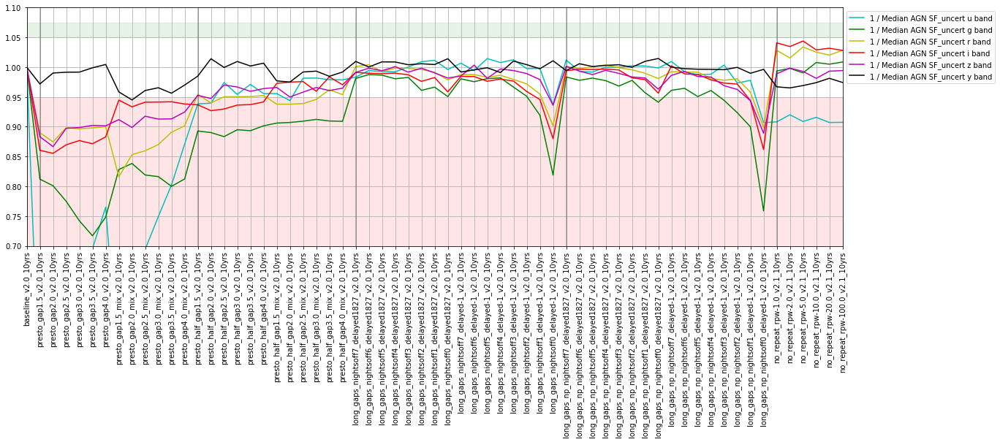

In [14]:
msubset = metric_set.loc['AGN SF'].query('invert == True')
fig, ax = maf.plot_run_metric(summaries.loc[these_runs, msubset['metric']],
                                  baseline_run='baseline_v2.0_10yrs',
                                  metric_label_map=msubset['short_name'],
                                  metric_set=msubset,
                             horizontal_quantity='run',
                             vertical_quantity='value')
fig.set_figwidth(20)
ax.set_ylim(0.7, 1.1)
for l in lines:
    ax.axvline(l, color='k', alpha=0.3)

And here we see that the long_gaps family is fairly neutral (except `long_gaps_nightsoff0_delayed-1`, the case where triplets are attempted every night for the entire survey, not delayed by 5 years), and is similarly bad for `long_gaps_np_nightsoff0_delayed-1`

The 'suppress repeats' family adds a weight to remove visits occuring within the same night (and typically these visits get moved to the following night). This improves the gap performance in all bands except u band.

The suppress repeats family adds a weight to remove repetition of pointings within a given night (pairs are acquired, but this reduces the likelihood of additional visits in the same night). This change appears to introduce some scatter in the median SF uncertainty but, without a preference for a given bandpass, is generally neutral. 

---
**bluer balance** : The standard filter balance in the dust-free WFD in the baseline is {'u': 0.07, 'g': 0.09, 'r': 0.22, 'i': 0.22, 'z': 0.20, 'y': 0.20}. These simulations vary the filter balance, skewing it bluer. One simulation adds visits to g band,while the other adds visits to both u and g band, in each case by taking some visits from rizy.  
**version**: 2.0  
**runs**:  


,brief,filepath
run,,
bluer_indx0_v2.0_10yrs,"More g - filter ratio in WFD of {'u': 0.07, 'g': 0.12, 'r': 0.21, 'i': 0.21, 'z': 0.19, 'y': 0.20}",fbs_2.0/bluer/bluer_indx0_v2.0_10yrs.db
bluer_indx1_v2.0_10yrs,"More u and g - filter ratio in WFD of {'u': 0.08, 'g': 0.11, 'r': 0.21, 'i': 0.21, 'z': 0.19, 'y': 0.20}",fbs_2.0/bluer/bluer_indx1_v2.0_10yrs.db


---
**longer u visits** : The baseline survey uses 2x15s visits for all bands except u band. In the baseline, u band visits are 1x30s to reduce the effects of readnoise (which are most extreme in u, due to the low sky-background). These simulations extend the u band visit time further, to 1x50s. In one simulation, the total amount of survey time spent on u band is kept the same, so the number of visits is reduced accordingly. In the other simulation, more survey time is spent in u band in order to maintain the number of visits in u.  
**version**: 2.0  
**runs**:  


,brief,filepath
run,,
long_u1_v2.0_10yrs,"u band visits 1x50s, number of u visits same as baseline",fbs_2.0/long_u/long_u1_v2.0_10yrs.db
long_u2_v2.0_10yrs,"u band visits 1x50s, fewer number of u visits",fbs_2.0/long_u/long_u2_v2.0_10yrs.db


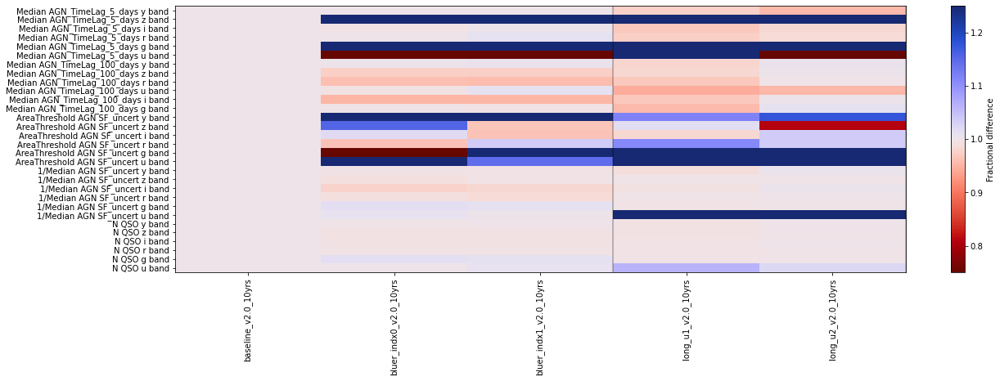

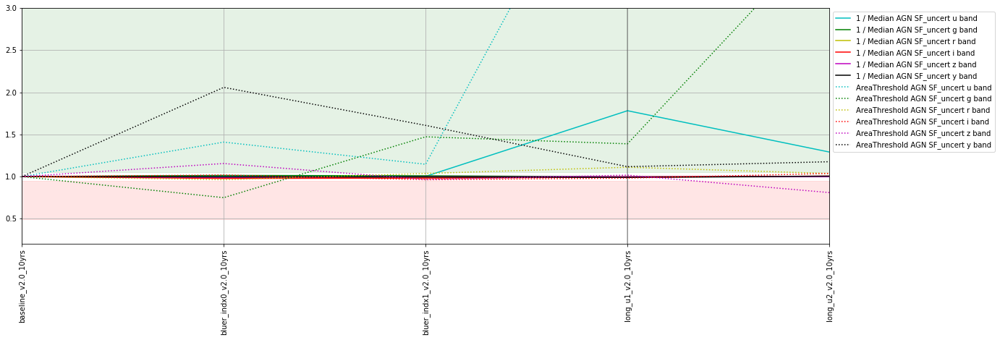

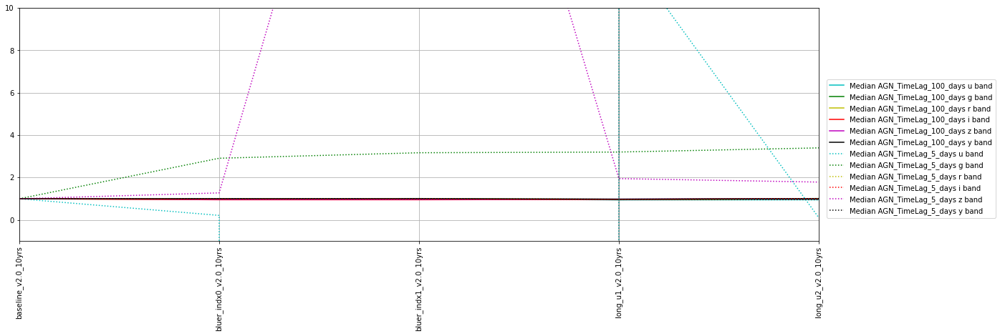

In [15]:
# Other families
fams = ['bluer balance', 'longer u visits']

baseline = families.loc[fams]['reference'][0]
these_runs = np.concatenate([[baseline], families.explode(['run']).loc[fams]['run']])

maf.describe_families(families.loc[fams])

fig, ax = maf.plot_run_metric_mesh(summaries.loc[these_runs, metrics['metric']],
                                  baseline_run=baseline,
                                  metric_label_map=metrics['short_name'],
                                  metric_set=metrics, 
                                  color_range=0.5)
fig.set_figwidth(20)
for l in (maf.find_family_lines(families, fams)+1):
    ax.axvline(l, color='k', alpha=0.3)
    
msubset = metric_set.loc['AGN SF']#.query('invert == True')
fig, ax = maf.plot_run_metric(summaries.loc[these_runs, msubset['metric']],
                                  baseline_run=baseline,
                                  metric_label_map=msubset['short_name'],
                                  metric_set=msubset,
                             horizontal_quantity='run',
                             vertical_quantity='value')
fig.set_figwidth(20)
ax.set_ylim(0.2, 3)
for l in (maf.find_family_lines(families, fams)+1):
    ax.axvline(l, color='k', alpha=0.3)
    
    
fig, ax = maf.plot_run_metric(summaries.loc[these_runs, metric_set.loc['AGN timelag']['metric']],
                                  baseline_run=baseline,
                                  metric_label_map=metric_set.loc['AGN timelag']['short_name'],
                                  metric_set=metric_set.loc['AGN timelag'],
                             horizontal_quantity='run',
                             vertical_quantity='value',
                             shade_fraction=0)
fig.set_figwidth(20)
ax.legend(loc=(1.01, 0.1))
ax.set_ylim(-1, 10)
for l in maf.find_family_lines(families, fams) + 1:
    ax.axvline(l, color='k', alpha=0.3)

The results here are somewhat surprising. Changing the filter balance bluer is generally helpful, but adding long u-band visits is really helpful - it's not clear why these AGN metrics favor bluer bands, when the metric is evaluated per-bandpass. Perhaps because the fewer number of visits just tends to sample the SF and timelags more poorly, while the larger number of visits in redder bandpasses tends to have better sampling and can afford to lose some visits? 

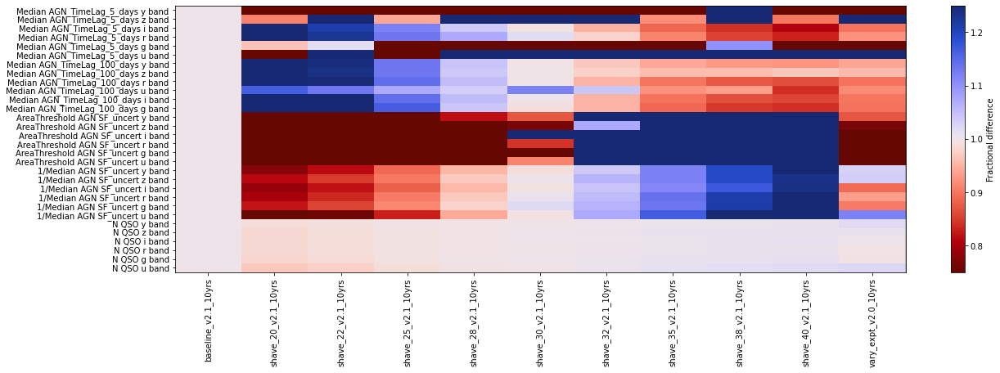

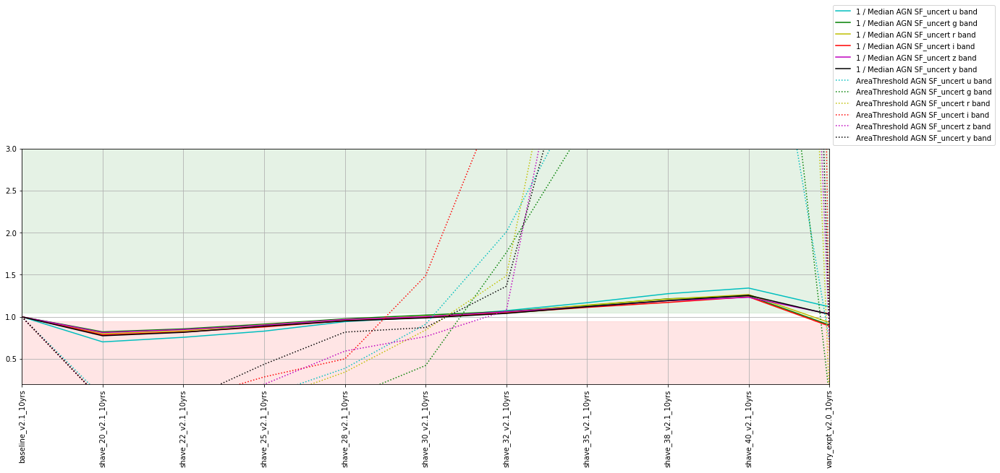

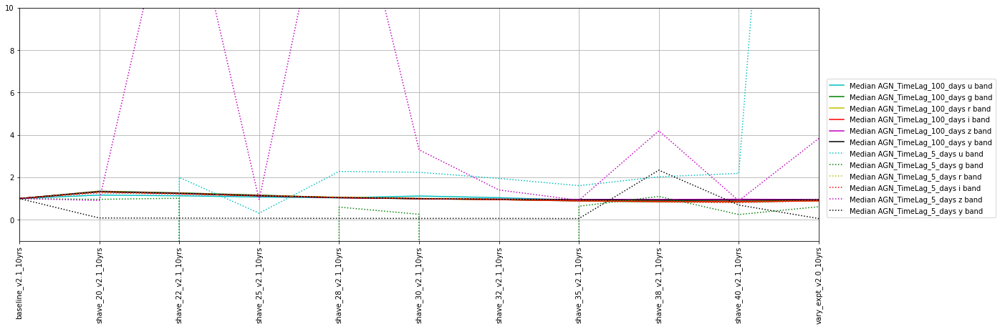

In [16]:
# Other families
fams = ['vary expt']

baseline = families.loc[fams]['reference'][0]
these_runs = np.concatenate([[baseline], families.explode(['run']).loc[fams]['run']])

fig, ax = maf.plot_run_metric_mesh(summaries.loc[these_runs, metrics['metric']],
                                  baseline_run=baseline,
                                  metric_label_map=metrics['short_name'],
                                  metric_set=metrics, 
                                  color_range=0.5)
fig.set_figwidth(20)
for l in (maf.find_family_lines(families, fams)+1):
    ax.axvline(l, color='k', alpha=0.3)
    
msubset = metric_set.loc['AGN SF']#.query('invert == True')
fig, ax = maf.plot_run_metric(summaries.loc[these_runs, msubset['metric']],
                                  baseline_run=baseline,
                                  metric_label_map=msubset['short_name'],
                                  metric_set=msubset,
                             horizontal_quantity='run',
                             vertical_quantity='value')
fig.set_figwidth(20)
ax.set_ylim(0.2, 3)
for l in (maf.find_family_lines(families, fams)+1):
    ax.axvline(l, color='k', alpha=0.3)
    
    
fig, ax = maf.plot_run_metric(summaries.loc[these_runs, metric_set.loc['AGN timelag']['metric']],
                                  baseline_run=baseline,
                                  metric_label_map=metric_set.loc['AGN timelag']['short_name'],
                                  metric_set=metric_set.loc['AGN timelag'],
                             horizontal_quantity='run',
                             vertical_quantity='value',
                             shade_fraction=0)
fig.set_figwidth(20)
ax.legend(loc=(1.01, 0.1))
ax.set_ylim(-1, 10)
for l in maf.find_family_lines(families, fams) + 1:
    ax.axvline(l, color='k', alpha=0.3)

Relatedly, changing the exposure time also drives the SF uncertainty - shorter visits result in larger uncertainties, longer visits result in smaller uncertainties. This is likely tied with the magnitude values used to evaluate the SF uncertainty -- these are constant across simulations, so the SNR in each typical image changes. Otherwise, I'd expect more visits to do a better job with time sampling.

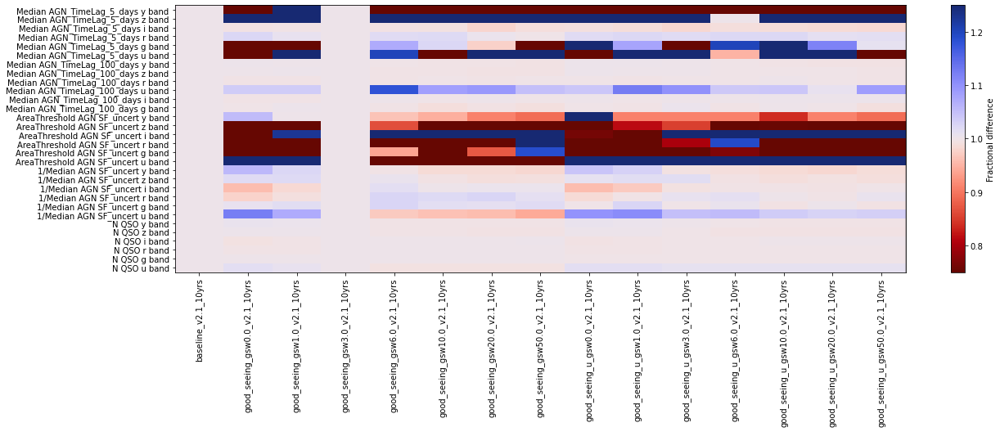

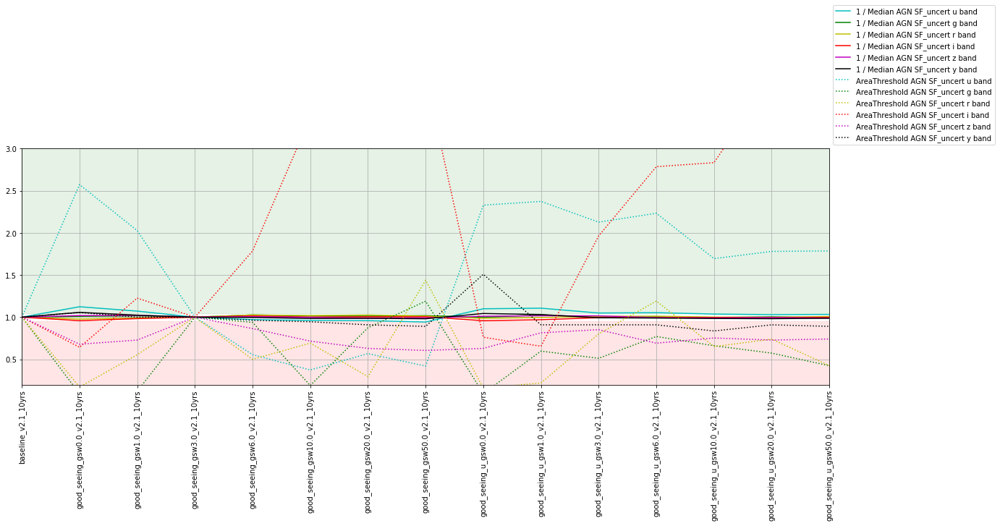

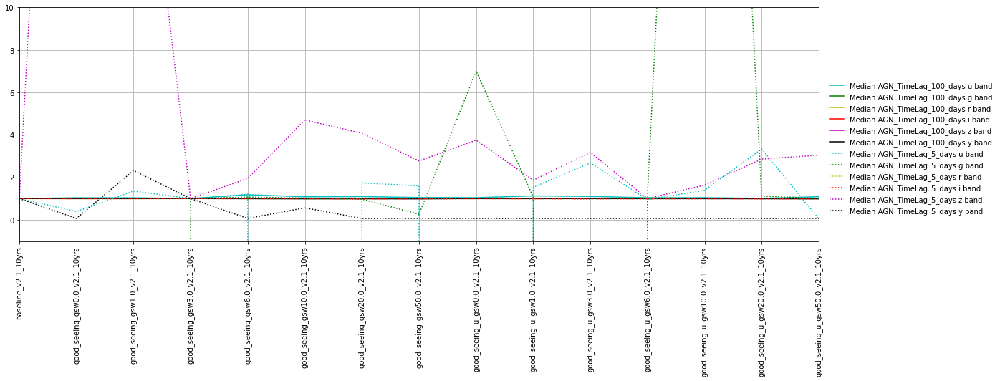

In [17]:
fams = ['good seeing', ]

baseline = 'baseline_v2.1_10yrs'
these_runs = np.concatenate([[baseline], families.explode(['run']).loc[fams]['run']])

fig, ax = maf.plot_run_metric_mesh(summaries.loc[these_runs, metrics['metric']],
                                  baseline_run=baseline,
                                  metric_label_map=metrics['short_name'],
                                  metric_set=metrics, 
                                  color_range=0.5)
fig.set_figwidth(20)
for l in (maf.find_family_lines(families, fams)+1):
    ax.axvline(l, color='k', alpha=0.3)
    
msubset = metric_set.loc['AGN SF']#.query('invert == True')
fig, ax = maf.plot_run_metric(summaries.loc[these_runs, msubset['metric']],
                                  baseline_run=baseline,
                                  metric_label_map=msubset['short_name'],
                                  metric_set=msubset,
                             horizontal_quantity='run',
                             vertical_quantity='value')
fig.set_figwidth(20)
ax.set_ylim(0.2, 3)
for l in (maf.find_family_lines(families, fams)+1):
    ax.axvline(l, color='k', alpha=0.3)
    
    
fig, ax = maf.plot_run_metric(summaries.loc[these_runs, metric_set.loc['AGN timelag']['metric']],
                                  baseline_run=baseline,
                                  metric_label_map=metric_set.loc['AGN timelag']['short_name'],
                                  metric_set=metric_set.loc['AGN timelag'],
                             horizontal_quantity='run',
                             vertical_quantity='value',
                             shade_fraction=0)
fig.set_figwidth(20)
ax.legend(loc=(1.01, 0.1))
ax.set_ylim(-1, 10)
for l in maf.find_family_lines(families, fams) + 1:
    ax.axvline(l, color='k', alpha=0.3)

Choosing to acquire 'good seeing' images in various bandpasses changes the SF uncertainty estimates as well, but generally in terms of increasing the scatter. The decreases in uncertainty in some bandpasses are countered with increases in other bands, as basically this represents trading "good seeing" time between bandpasses in the scheduler. 

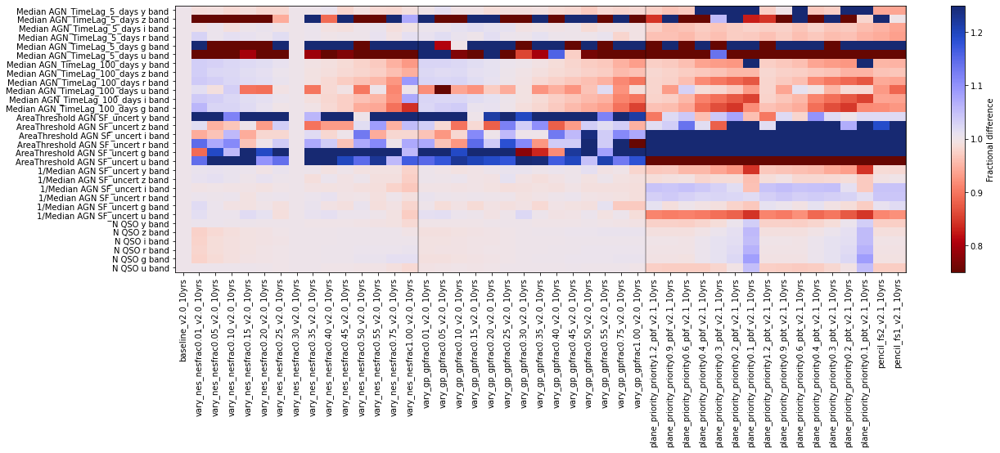

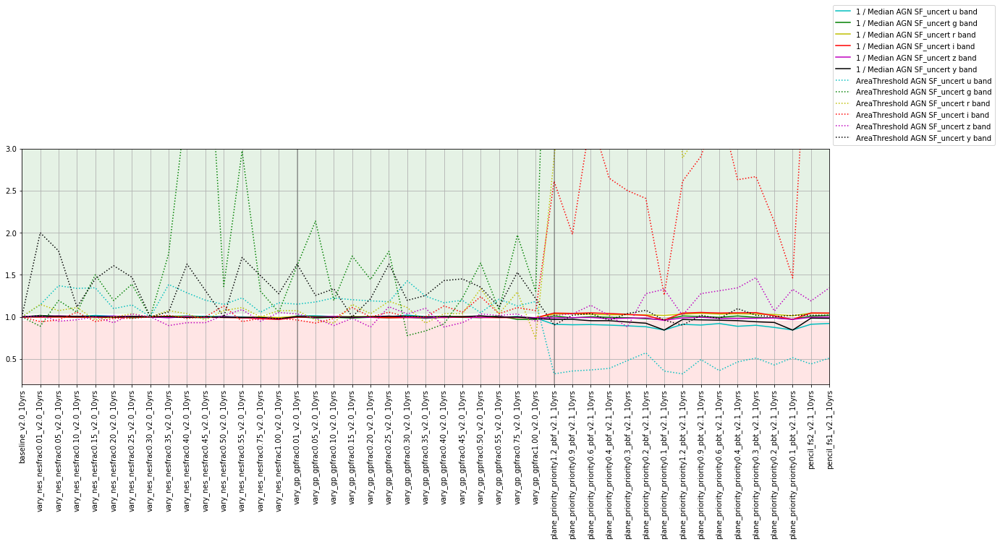

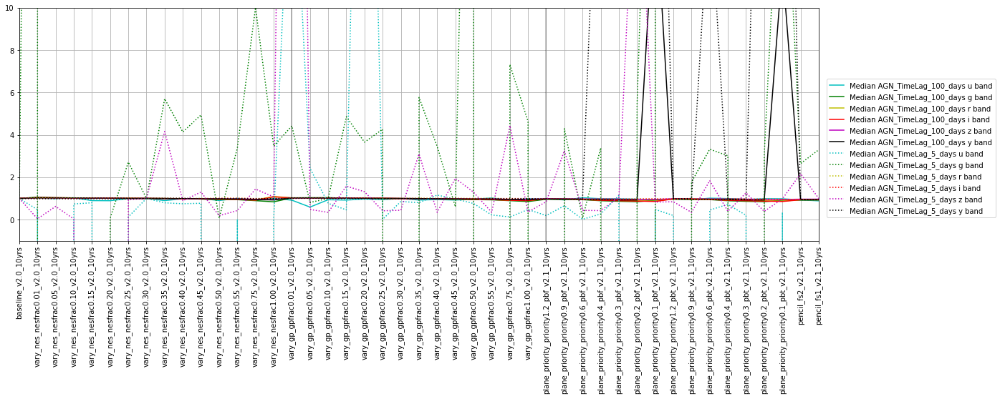

In [18]:
# Footprint options

fams = ['vary nes', 'vary gp', 'galactic plane footprint']

baseline = families.loc[fams]['reference'][0]
these_runs = np.concatenate([[baseline], families.explode(['run']).loc[fams]['run']])

fig, ax = maf.plot_run_metric_mesh(summaries.loc[these_runs, metrics['metric']],
                                  baseline_run=baseline,
                                  metric_label_map=metrics['short_name'],
                                  metric_set=metrics, 
                                  color_range=0.5)
fig.set_figwidth(20)
for l in (maf.find_family_lines(families, fams)+1):
    ax.axvline(l, color='k', alpha=0.3)
    
msubset = metric_set.loc['AGN SF']#.query('invert == True')
fig, ax = maf.plot_run_metric(summaries.loc[these_runs, msubset['metric']],
                                  baseline_run=baseline,
                                  metric_label_map=msubset['short_name'],
                                  metric_set=msubset,
                             horizontal_quantity='run',
                             vertical_quantity='value')
fig.set_figwidth(20)
ax.set_ylim(0.2, 3)
for l in (maf.find_family_lines(families, fams)+1):
    ax.axvline(l, color='k', alpha=0.3)
    
    
fig, ax = maf.plot_run_metric(summaries.loc[these_runs, metric_set.loc['AGN timelag']['metric']],
                                  baseline_run=baseline,
                                  metric_label_map=metric_set.loc['AGN timelag']['short_name'],
                                  metric_set=metric_set.loc['AGN timelag'],
                             horizontal_quantity='run',
                             vertical_quantity='value',
                             shade_fraction=0)
fig.set_figwidth(20)
ax.legend(loc=(1.01, 0.1))
ax.set_ylim(-1, 10)
for l in maf.find_family_lines(families, fams) + 1:
    ax.axvline(l, color='k', alpha=0.3)

Basically each of these families represents spending slightly more (left side of each family) or less (right side) of survey time in these mini-survey regions, instead of in the WFD regions. While the vary_nes and vary_gp families are relatively small effects until they ramp up to "equivalent to WFD weight", the galactic plane footprint family shows a wider spread in effect - including both positive and negative impacts in different bandpasses. 
It is likely worth noting that the mini-survey regions are observed with a different filter distribution than the main low-dust WFD, which likely explains the different impacts in different filters. 

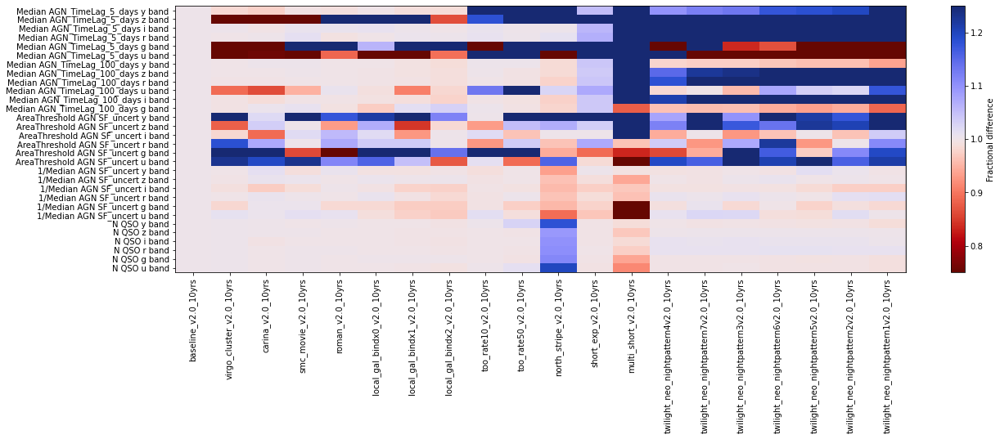

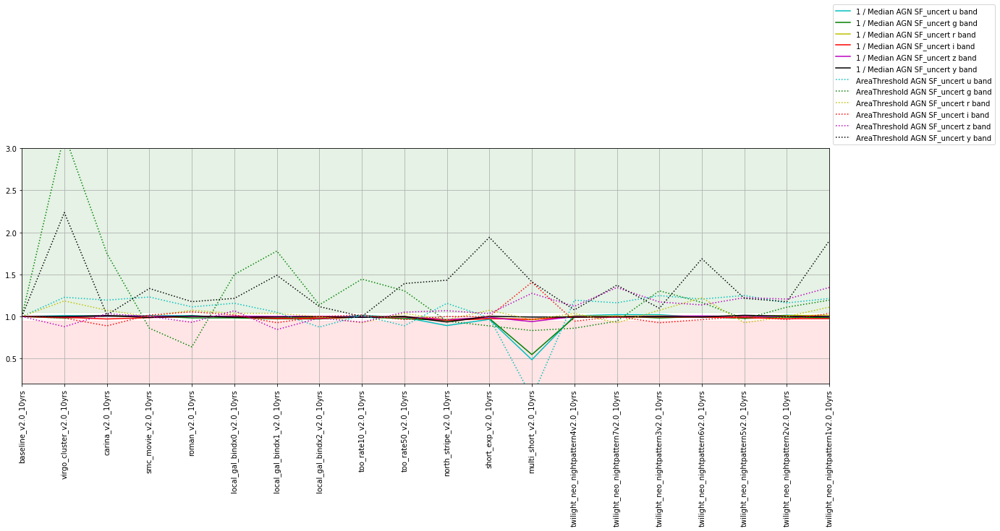

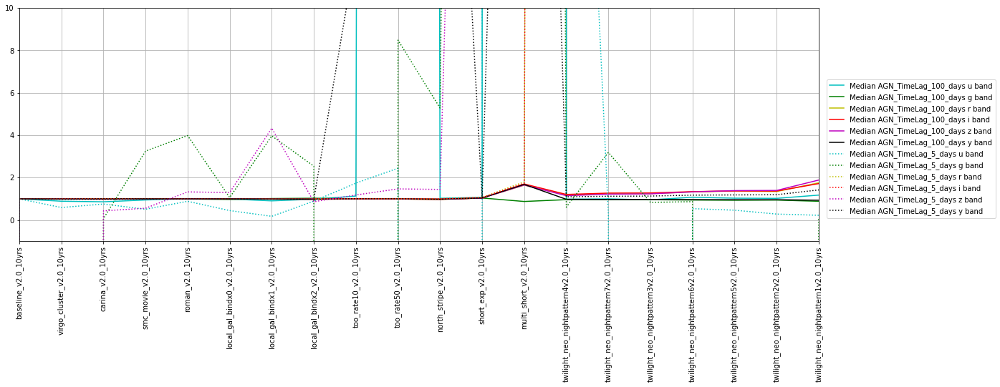

In [19]:
fams = ['microsurveys']
baseline = families.loc[fams]['reference'][0]
these_runs = np.concatenate([[baseline], families.explode(['run']).loc[fams]['run']])

fig, ax = maf.plot_run_metric_mesh(summaries.loc[these_runs, metrics['metric']],
                                  baseline_run=baseline,
                                  metric_label_map=metrics['short_name'],
                                  metric_set=metrics, 
                                  color_range=0.5)
fig.set_figwidth(20)
for l in (maf.find_family_lines(families, fams)+1):
    ax.axvline(l, color='k', alpha=0.3)
    
msubset = metric_set.loc['AGN SF']#.query('invert == True')
fig, ax = maf.plot_run_metric(summaries.loc[these_runs, msubset['metric']],
                                  baseline_run=baseline,
                                  metric_label_map=msubset['short_name'],
                                  metric_set=msubset,
                             horizontal_quantity='run',
                             vertical_quantity='value')
fig.set_figwidth(20)
ax.set_ylim(0.2, 3)
for l in (maf.find_family_lines(families, fams)+1):
    ax.axvline(l, color='k', alpha=0.3)
    
    
fig, ax = maf.plot_run_metric(summaries.loc[these_runs, metric_set.loc['AGN timelag']['metric']],
                                  baseline_run=baseline,
                                  metric_label_map=metric_set.loc['AGN timelag']['short_name'],
                                  metric_set=metric_set.loc['AGN timelag'],
                             horizontal_quantity='run',
                             vertical_quantity='value',
                             shade_fraction=0)
fig.set_figwidth(20)
ax.legend(loc=(1.01, 0.1))
ax.set_ylim(-1, 10)
for l in maf.find_family_lines(families, fams) + 1:
    ax.axvline(l, color='k', alpha=0.3)

None of these microsurveys are set up to benefit AGNs in particular, so it's not surprising there are no big boosts in the metrics here. The `multi_short` microsurvey drives many visits into short (low SNR) visits, which has a clear negative impact on the SF metric results. Most of the other microsurveys are relatively neutral. 

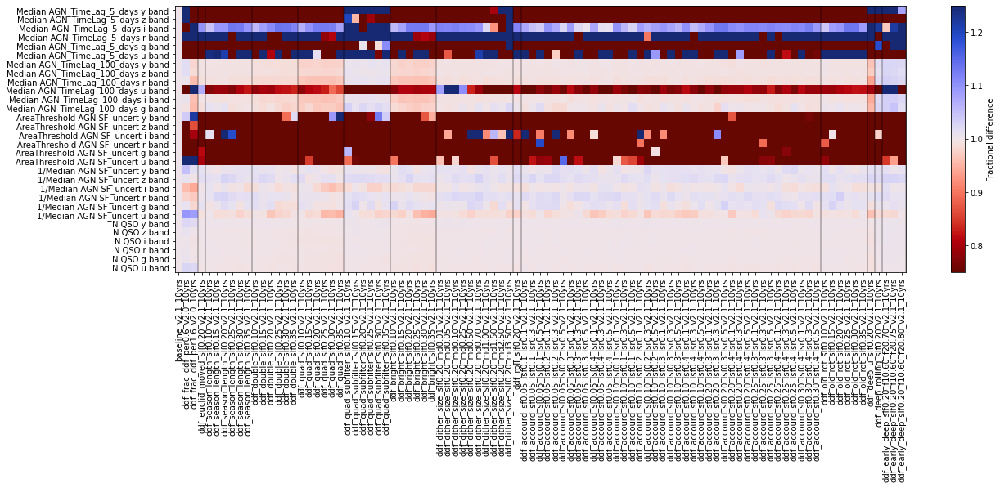

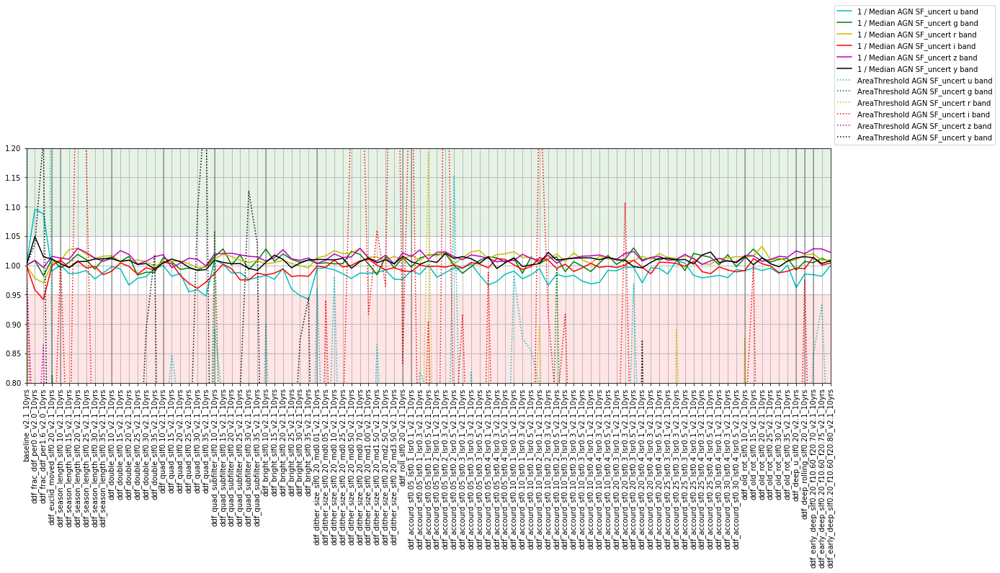

In [21]:
fams = [f for f in family_list if f.startswith('ddf')]

#baseline = families.loc[fams]['reference'][0]
baseline = 'baseline_v2.1_10yrs'
these_runs = np.concatenate([[baseline], families.explode(['run']).loc[fams]['run']])

fig, ax = maf.plot_run_metric_mesh(summaries.loc[these_runs, metrics['metric']],
                                  baseline_run=baseline,
                                  metric_label_map=metrics['short_name'],
                                  metric_set=metrics, 
                                  color_range=0.5)
fig.set_figwidth(20)
for l in (maf.find_family_lines(families, fams)+1):
    ax.axvline(l, color='k', alpha=0.3)
    
msubset = metric_set.loc['AGN SF']#.query('invert == True')
fig, ax = maf.plot_run_metric(summaries.loc[these_runs, msubset['metric']],
                                  baseline_run=baseline,
                                  metric_label_map=msubset['short_name'],
                                  metric_set=msubset,
                             horizontal_quantity='run',
                             vertical_quantity='value')
fig.set_figwidth(20)
ax.set_ylim(0.8, 1.2)
for l in (maf.find_family_lines(families, fams)+1):
    ax.axvline(l, color='k', alpha=0.3)

So this is a bit complicated - v2.1 introduces pre-scheduled DDFs, so those runs are all a bit different from the 'original'. However, the metrics above reflect what is happening in the "rest of the sky" not the DDF fields. Generally, what I'd take away from these is that as the season length changes (`ddf_season_length` runs), things don't change too much, but as the sequences in the DDF get shorter (`ddf_double`, `ddf quad`, etc.) then statistics in the general WFD go down somewhat. Again, the area threshold metric may be overly sensitive to variations that may not lead to a lot of real changes in the science gained - and the median values of the SF uncertainty don't change much through the various DDF runs (beyond the ddf_frac versions, which vary the overall time). 

Basically what it seems like we see here is that more visits in the non-DD survey = better metrics in the non-DD survey, and at a proportionality lower than 1-1. 

### DDF ### 
Now let's look at the variations on the DDF strategy. 

NOTE `baseline_v2.1_10yrs` doesn't use pre-scheduled DDFs, so the comparison can be misleading. Choose one of the pre-scheduled examples. 

ALSO! We have since found the following issues with the v2.1 DDF series. Issues include:
* the filter balance in the prescheduled DDF sequences in incorrect (there is more g than r band time, rather than the reverse) -- HOWEVER it also looks like the total number of SLSN increases regardless of this balance, and the number of SN can increase too (depending on season length) .. the redshift limit is decreased however, so this is likely something that needs to be corrected. 
* the number of visits allocated to DDFs varied unintentionally; overall the DDFs are taking more time than we had allocated, and there is a small amount of 'wander' in the total time they use, which should be accounted for when comparing metrics.
* the moon could be up during DDF sequences, or they could potentially run into twilight

These issues make comparison with non-prescheduled DDF runs difficult, and can make comparison within a series difficult, although not necessarily impossible. Please ask us if you have questions about a particular metric or series of runs and we can try to help you figure out how to compare the metric results.

In [35]:
metrics = metric_set.loc['AGN SF DDF']
ddfs = ['COSMOS', 'XMM_LSS', 'ELAISS1', 'ECDFS', 'EDFS']
metrics[::6]

,metric,short_name,style,invert,mag
metric,,,,,
Median Structure Function Uncert DD:ELAISS1 u band HealpixSubsetSlicer,Median Structure Function Uncert DD:ELAISS1 u ...,Median AGN SF Uncert ELAISS1 u,c-,True,False
Median Structure Function Uncert DD:XMM_LSS u band HealpixSubsetSlicer,Median Structure Function Uncert DD:XMM_LSS u ...,Median AGN SF Uncert XMM_LSS u,c-,True,False
Median Structure Function Uncert DD:COSMOS u band HealpixSubsetSlicer,Median Structure Function Uncert DD:COSMOS u b...,Median AGN SF Uncert COSMOS u,c-,True,False
Median Structure Function Uncert DD:ECDFS u band HealpixSubsetSlicer,Median Structure Function Uncert DD:ECDFS u ba...,Median AGN SF Uncert ECDFS u,c-,True,False
Median Structure Function Uncert DD:EDFS u band HealpixSubsetSlicer,Median Structure Function Uncert DD:EDFS u ban...,Median AGN SF Uncert EDFS u,c-,True,False
Median Structure Function Uncert DD:WFD u band HealpixSubsetSlicer,Median Structure Function Uncert DD:WFD u band...,Median AGN SF Uncert WFD u,c-,True,False


In [36]:
maf.describe_families(families.loc[['ddf season length']])

---
**ddf season length** : This family investigates the effect of varying the season length within the DDF fields. `season length fraction` reflects how much of the available season is used -- 0.1 indicates that 10% of the available season is removed at each end (for a total of 80% of the available season used for observations), while 0.3 would indicate that 40% of the total possible season is used. This family uses pre-scheduled DDF visits.  
**version**: 2.1  
**runs**:  


,brief,filepath
run,,
ddf_season_length_slf0.10_v2.1_10yrs,DDF with season length fraction 0.10,fbs_2.1/ddf_1/ddf_season_length_slf0.10_v2.1_10yrs.db
ddf_season_length_slf0.15_v2.1_10yrs,DDF with season length fraction 0.15,fbs_2.1/ddf_1/ddf_season_length_slf0.15_v2.1_10yrs.db
ddf_season_length_slf0.20_v2.1_10yrs,DDF with season length fraction 0.20,fbs_2.1/ddf_1/ddf_season_length_slf0.20_v2.1_10yrs.db
ddf_season_length_slf0.25_v2.1_10yrs,DDF with season length fraction 0.25,fbs_2.1/ddf_1/ddf_season_length_slf0.25_v2.1_10yrs.db
ddf_season_length_slf0.30_v2.1_10yrs,DDF with season length fraction 0.30,fbs_2.1/ddf_1/ddf_season_length_slf0.30_v2.1_10yrs.db
ddf_season_length_slf0.35_v2.1_10yrs,DDF with season length fraction 0.35,fbs_2.1/ddf_1/ddf_season_length_slf0.35_v2.1_10yrs.db


(None, None)

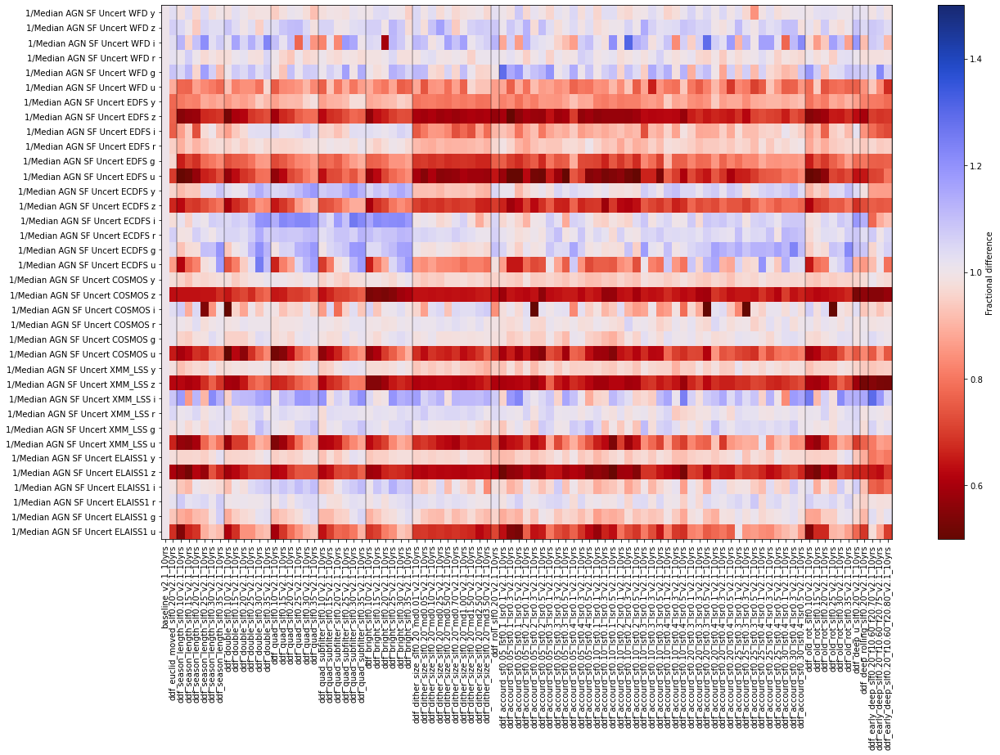

In [37]:
fams = [f for f in family_list if f.startswith('ddf') and f!='ddf percent']

#baseline = families.loc[fams]['reference'][0]
baseline = 'baseline_v2.1_10yrs'
these_runs = np.concatenate([[baseline], families.explode(['run']).loc[fams]['run']])

fig, ax = maf.plot_run_metric_mesh(summaries.loc[these_runs, metrics['metric']],
                                  baseline_run=baseline,
                                  metric_label_map=metrics['short_name'],
                                  metric_set=metrics, 
                                  color_range=1)
fig.set_figwidth(20)
fig.set_figheight(12)
for l in (maf.find_family_lines(families, fams)+1):
    ax.axvline(l, color='k', alpha=0.3)
    

One thing that jumps out is that the results all differ from the baseline_v2.1 metric values. `baseline_v2.1_10yrs` did NOT use pre-scheduled DDFs, and that seems to make quite a bit of different particularly in z and u bands (which, notably, are the filters we swap over the lunar cycle, and the pre-scheduling was intended to make best advantage of the deeper visits around new moon and avoid bright time). 

To make it easier to see the effects of the different pre-scheduled strategies, we'll swap the baseline to one of these pre-scheduled versions (`ddf_season_length_slf0.20_v2.1_10yrs` uses an intermediate-length season but no other advantages of pre-scheduling). 

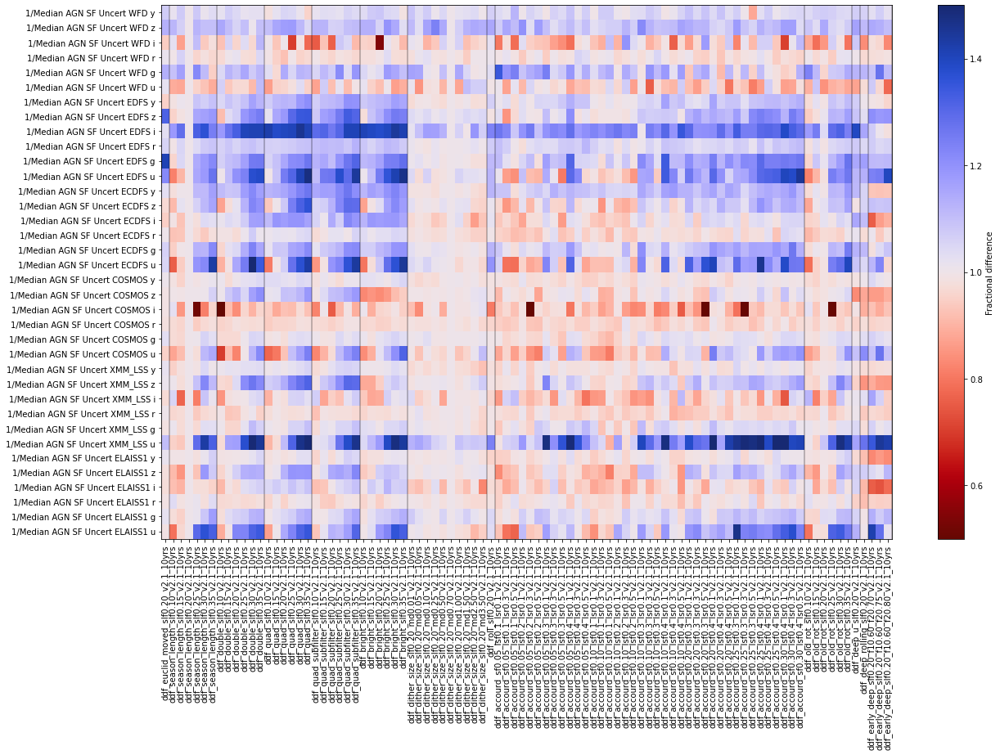

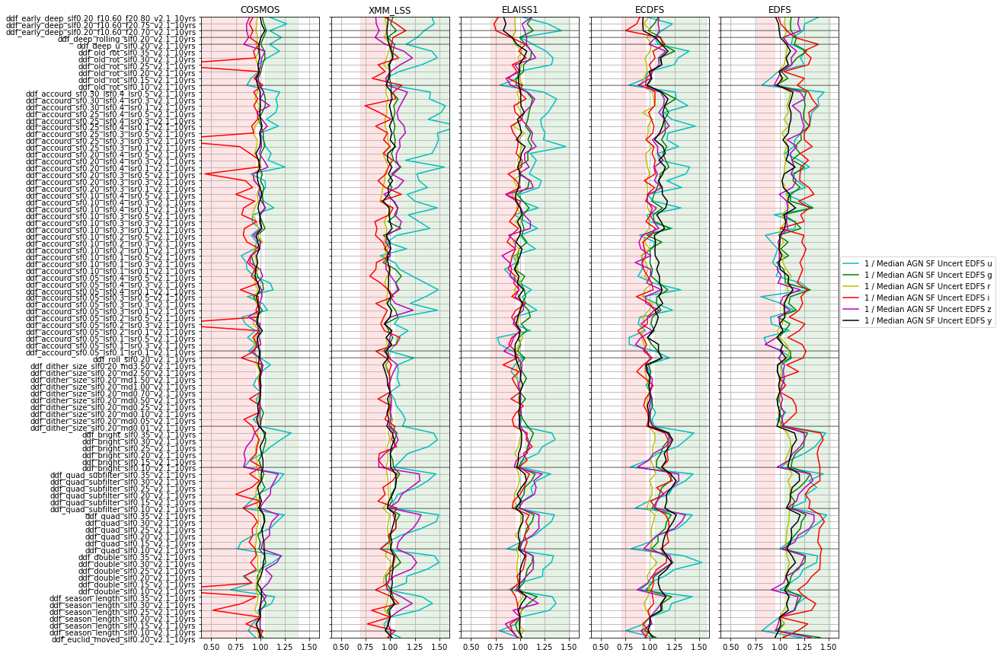

In [44]:
fams = [f for f in family_list if f.startswith('ddf') and f!='ddf percent']

baseline = 'ddf_season_length_slf0.20_v2.1_10yrs'
these_runs = families.explode(['run']).loc[fams]['run']

fig, ax = maf.plot_run_metric_mesh(summaries.loc[these_runs, metrics['metric']],
                                  baseline_run=baseline,
                                  metric_label_map=metrics['short_name'],
                                  metric_set=metrics, 
                                  color_range=1)
fig.set_figwidth(20)
fig.set_figheight(12)
for l in maf.find_family_lines(families, fams):
    ax.axvline(l, color='k', alpha=0.3)
    
fig = plt.figure(figsize=(15, 15))
gs = fig.add_gridspec(ncols=5, nrows=1, wspace=0.1)
axs = gs.subplots(sharey=True)
for dd, ax  in zip(ddfs, axs):
    msubset = metrics.query('metric.str.contains(@dd)')
    fig, ax = maf.plot_run_metric(summaries.loc[these_runs, msubset['metric']],
                                      baseline_run=baseline,
                                      metric_label_map=msubset['short_name'],
                                      metric_set=msubset,
                                 horizontal_quantity='value',
                                 vertical_quantity='run',
                                 ax=ax)
    ax.get_legend().remove()
    ax.set_xlim(0.4, 1.6)
    ax.set_title(dd)
    for l in (maf.find_family_lines(families, fams)):
        ax.axhline(l, color='k', alpha=0.3)
ax.legend(loc=(1.01, 0.5))

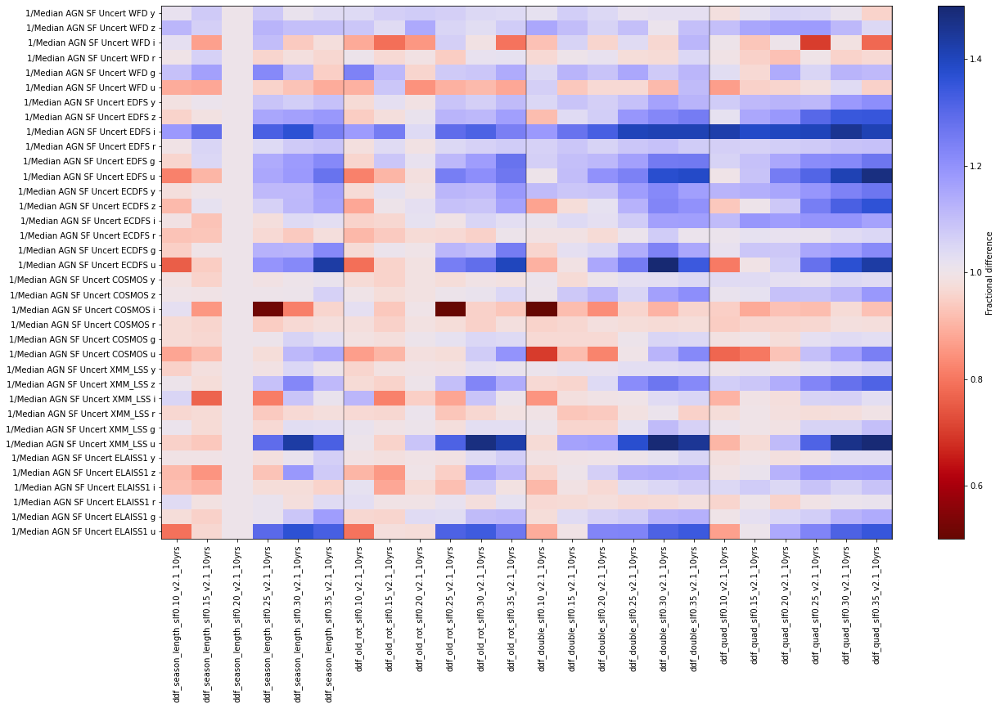

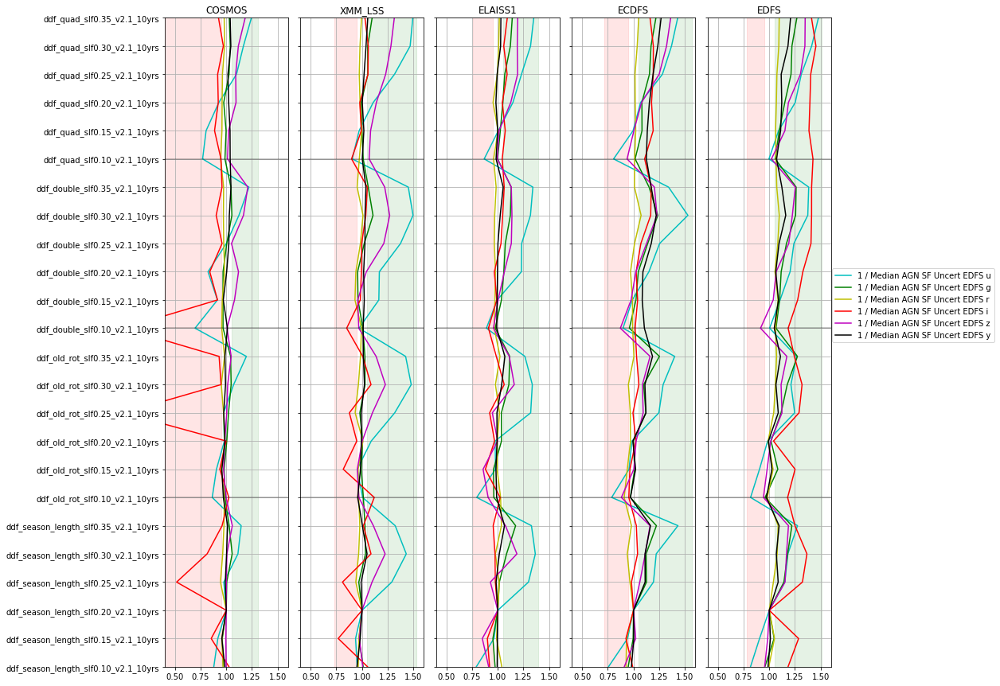

In [43]:
fams = ['ddf season length', 'ddf old rot', 'ddf double', 'ddf quad',]
#baseline = families.loc[fams]['reference'][0]
baseline = 'ddf_season_length_slf0.20_v2.1_10yrs'
these_runs = np.concatenate([[], families.explode(['run']).loc[fams]['run']])

fig, ax = maf.plot_run_metric_mesh(summaries.loc[these_runs, metrics['metric']],
                                  baseline_run=baseline,
                                  metric_label_map=metrics['short_name'],
                                  metric_set=metrics, 
                                  color_range=1)
fig.set_figwidth(20)
fig.set_figheight(12)
for l in (maf.find_family_lines(families, fams)):
    ax.axvline(l, color='k', alpha=0.3)


fig = plt.figure(figsize=(15, 15))
gs = fig.add_gridspec(ncols=5, nrows=1, wspace=0.1)
axs = gs.subplots(sharey=True)
for dd, ax  in zip(ddfs, axs):
    msubset = metrics.query('metric.str.contains(@dd)')
    fig, ax = maf.plot_run_metric(summaries.loc[these_runs, msubset['metric']],
                                      baseline_run=baseline,
                                      metric_label_map=msubset['short_name'],
                                      metric_set=msubset,
                                 horizontal_quantity='value',
                                 vertical_quantity='run',
                                 ax=ax)
    ax.get_legend().remove()
    ax.set_xlim(0.4, 1.6)
    ax.set_title(dd)
    for l in (maf.find_family_lines(families, fams)):
        ax.axhline(l, color='k', alpha=0.3)
ax.legend(loc=(1.01, 0.5))

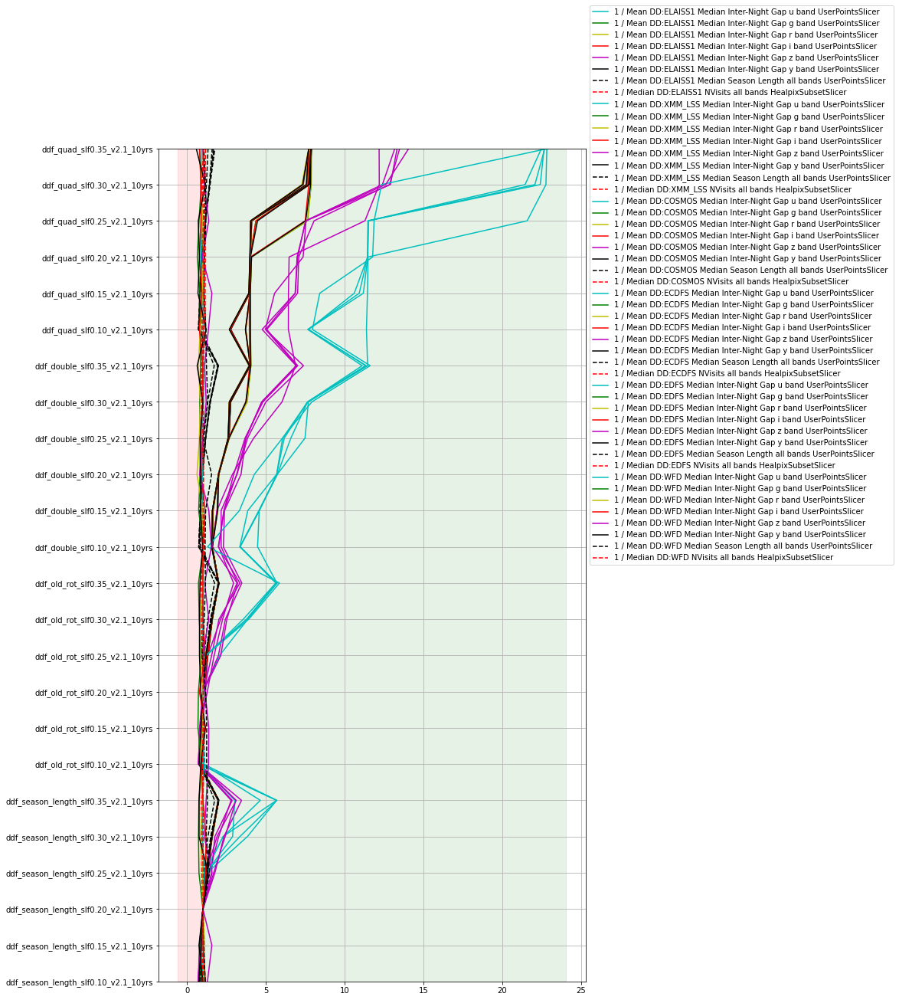

In [45]:
# Let's have a quick look at the season length, inter-night gaps, and overall number of visits and depths

fams = ['ddf season length', 'ddf old rot', 'ddf double', 'ddf quad',]

baseline = 'ddf_season_length_slf0.20_v2.1_10yrs'
#baseline = 'baseline_v2.1_10yrs'
these_runs = np.concatenate([[], families.explode(['run']).loc[fams]['run']])

new = metric_set.loc['DDF Cadence']

fig, ax = maf.plot_run_metric(summaries.loc[these_runs, new['metric']], 
                    baseline_run=baseline,
                   metric_set = new)
fig.set_figheight(20)
ax.legend(loc=(1.01, 0.5))
#ax.set_xlim(0.4, 1.3)

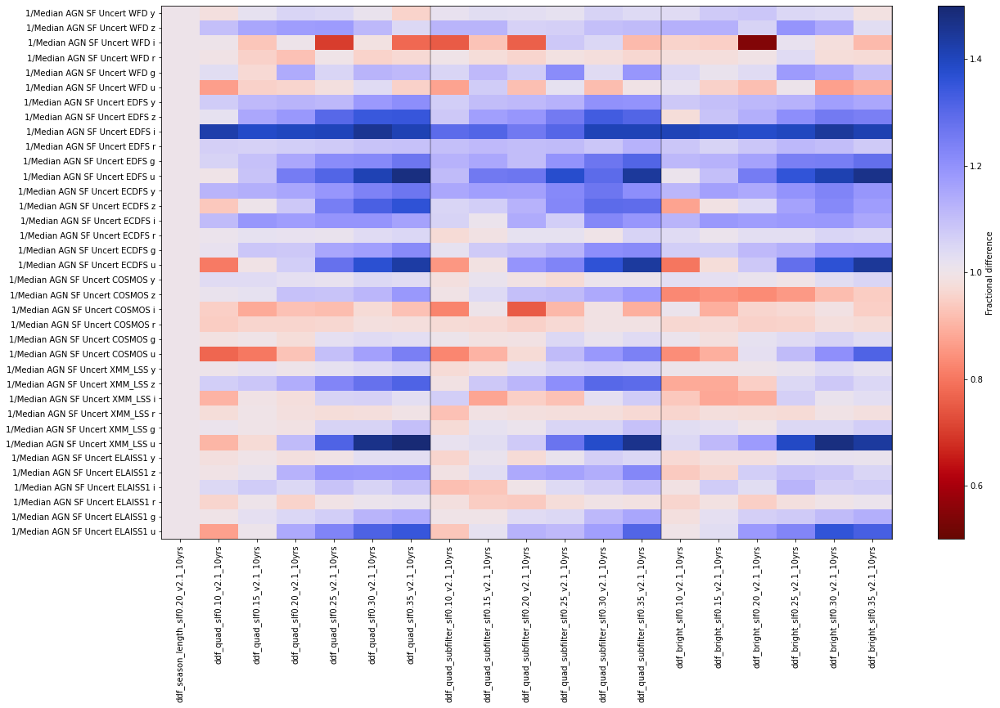

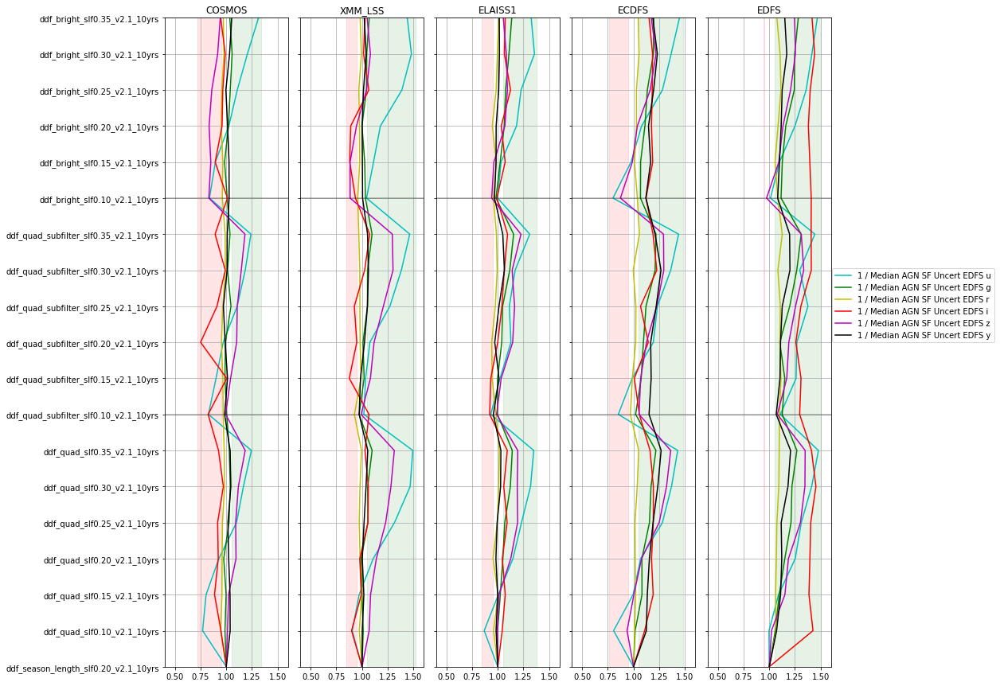

In [47]:
fams = ['ddf quad', 'ddf quad subfilter', 'ddf bright']
baseline = 'ddf_season_length_slf0.20_v2.1_10yrs'
these_runs = np.concatenate([[baseline], families.explode(['run']).loc[fams]['run']])

fig, ax = maf.plot_run_metric_mesh(summaries.loc[these_runs, metrics['metric']],
                                  baseline_run=baseline,
                                  metric_label_map=metrics['short_name'],
                                  metric_set=metrics, 
                                  color_range=1)
fig.set_figwidth(20)
fig.set_figheight(12)
for l in (maf.find_family_lines(families, fams)+1):
    ax.axvline(l, color='k', alpha=0.3)


fig = plt.figure(figsize=(15, 15))
gs = fig.add_gridspec(ncols=5, nrows=1, wspace=0.1)
axs = gs.subplots(sharey=True)
for dd, ax  in zip(ddfs, axs):
    msubset = metrics.query('metric.str.contains(@dd)')
    fig, ax = maf.plot_run_metric(summaries.loc[these_runs, msubset['metric']],
                                      baseline_run=baseline,
                                      metric_label_map=msubset['short_name'],
                                      metric_set=msubset,
                                 horizontal_quantity='value',
                                 vertical_quantity='run',
                                 ax=ax)
    ax.get_legend().remove()
    ax.set_xlim(0.4, 1.6)
    ax.set_title(dd)
    for l in (maf.find_family_lines(families, fams)+1):
        ax.axhline(l, color='k', alpha=0.3)
ax.legend(loc=(1.01, 0.5))

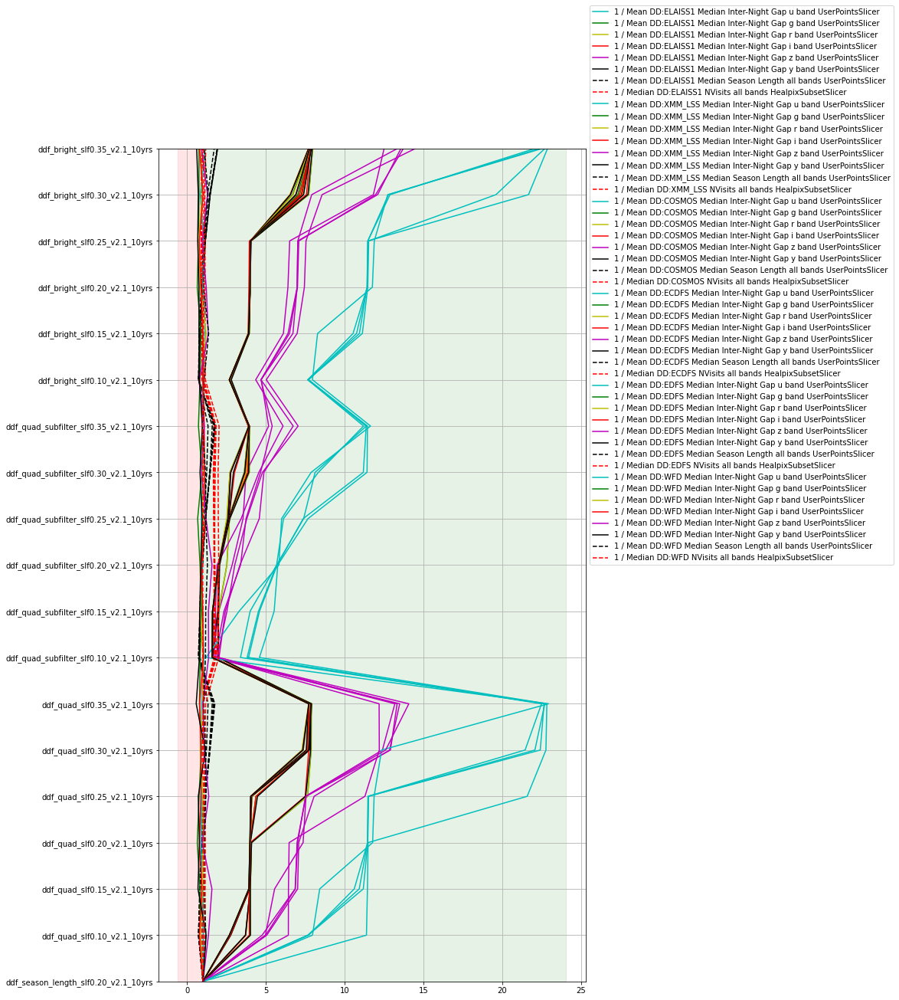

In [48]:
# Let's have a quick look at the season length, inter-night gaps, and overall number of visits and depths
cad = metric_set.loc['DDF Cadence']
fig, ax = maf.plot_run_metric(summaries.loc[these_runs, cad['metric']], 
                    baseline_run=baseline,
                   metric_set = cad)
fig.set_figheight(20)
ax.legend(loc=(1.01, 0.5))
#ax.set_xlim(0.4, 1.3)

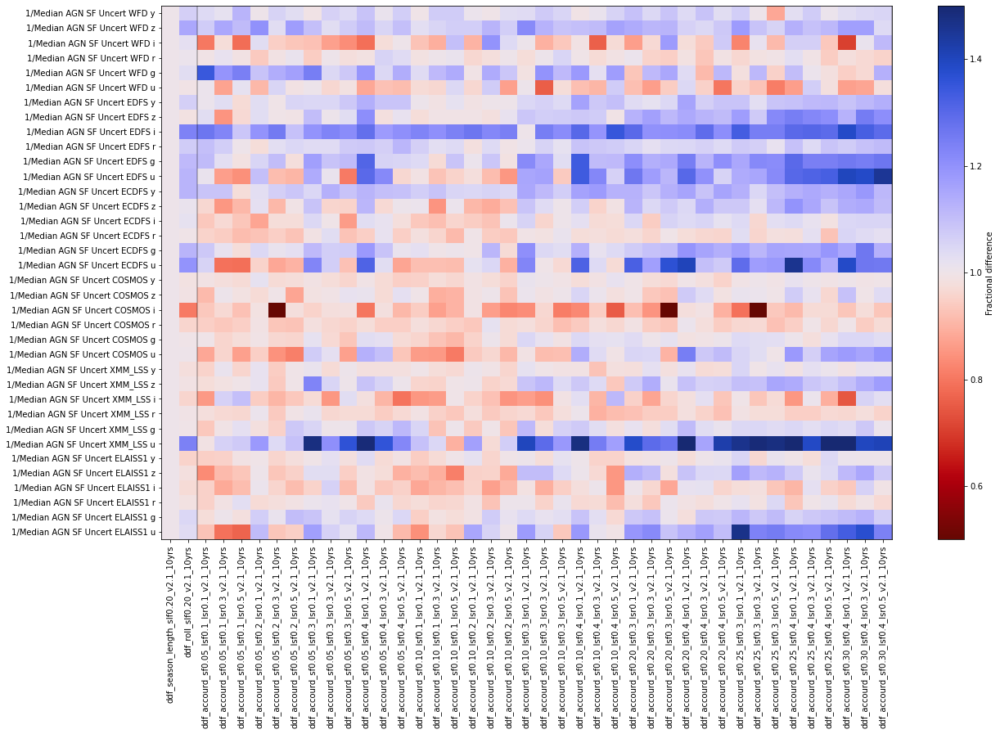

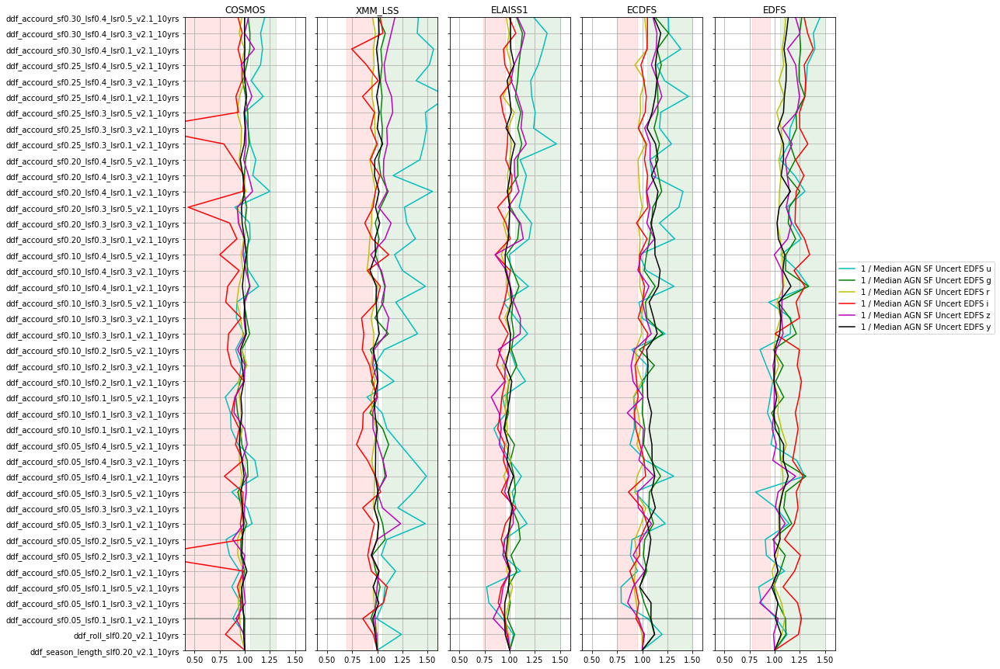

In [49]:
fams = ['ddf roll', 'ddf accordian']
baseline = 'ddf_season_length_slf0.20_v2.1_10yrs'
these_runs = np.concatenate([[baseline], families.explode(['run']).loc[fams]['run']])

fig, ax = maf.plot_run_metric_mesh(summaries.loc[these_runs, metrics['metric']],
                                  baseline_run=baseline,
                                  metric_label_map=metrics['short_name'],
                                  metric_set=metrics, 
                                  color_range=1)
fig.set_figwidth(20)
fig.set_figheight(12)
for l in (maf.find_family_lines(families, fams)+1):
    ax.axvline(l, color='k', alpha=0.3)


fig = plt.figure(figsize=(15, 15))
gs = fig.add_gridspec(ncols=5, nrows=1, wspace=0.1)
axs = gs.subplots(sharey=True)
for dd, ax  in zip(ddfs, axs):
    msubset = metrics.query('metric.str.contains(@dd)')
    fig, ax = maf.plot_run_metric(summaries.loc[these_runs, msubset['metric']],
                                      baseline_run=baseline,
                                      metric_label_map=msubset['short_name'],
                                      metric_set=msubset,
                                 horizontal_quantity='value',
                                 vertical_quantity='run',
                                 ax=ax)
    ax.get_legend().remove()
    ax.set_xlim(0.4, 1.6)
    ax.set_title(dd)
    for l in (maf.find_family_lines(families, fams)+1):
        ax.axhline(l, color='k', alpha=0.3)
ax.legend(loc=(1.01, 0.5))

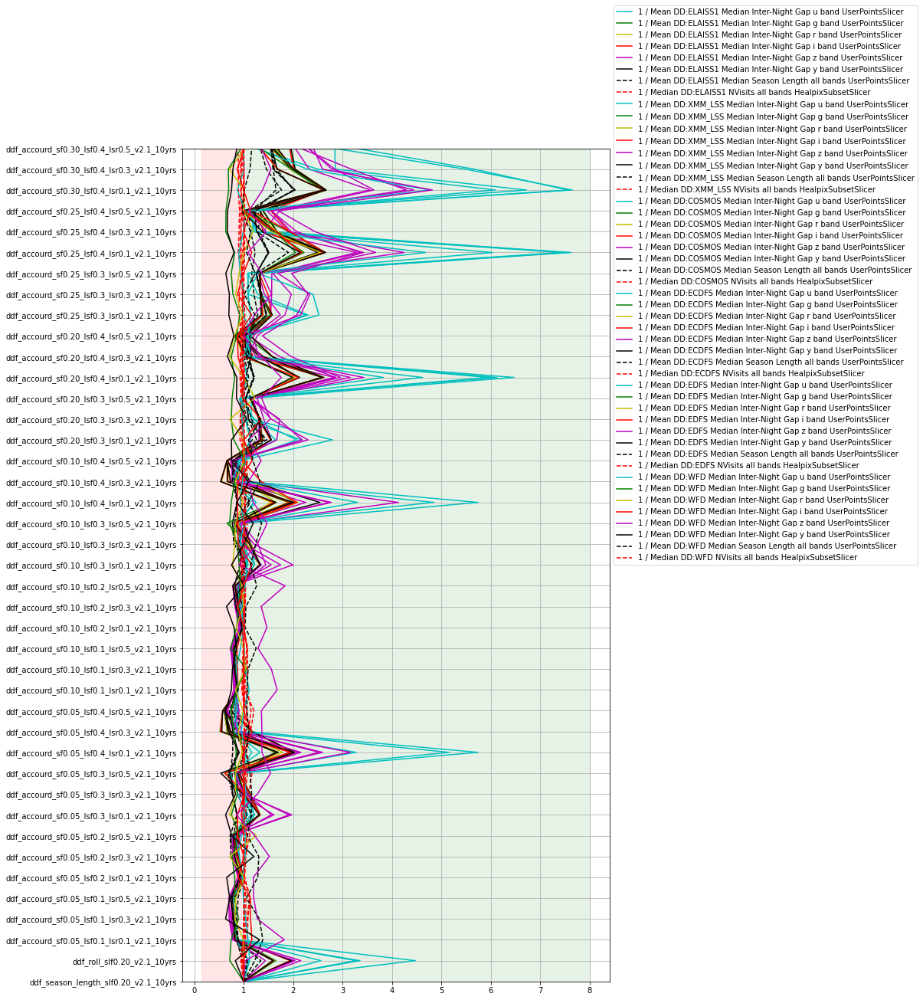

In [50]:
# Let's have a quick look at the season length, inter-night gaps, and overall number of visits and depths
fig, ax = maf.plot_run_metric(summaries.loc[these_runs, cad['metric']], 
                    baseline_run=baseline,
                   metric_set = cad)
fig.set_figheight(20)
ax.legend(loc=(1.01, 0.5))
#ax.set_xlim(0.4, 1.3)

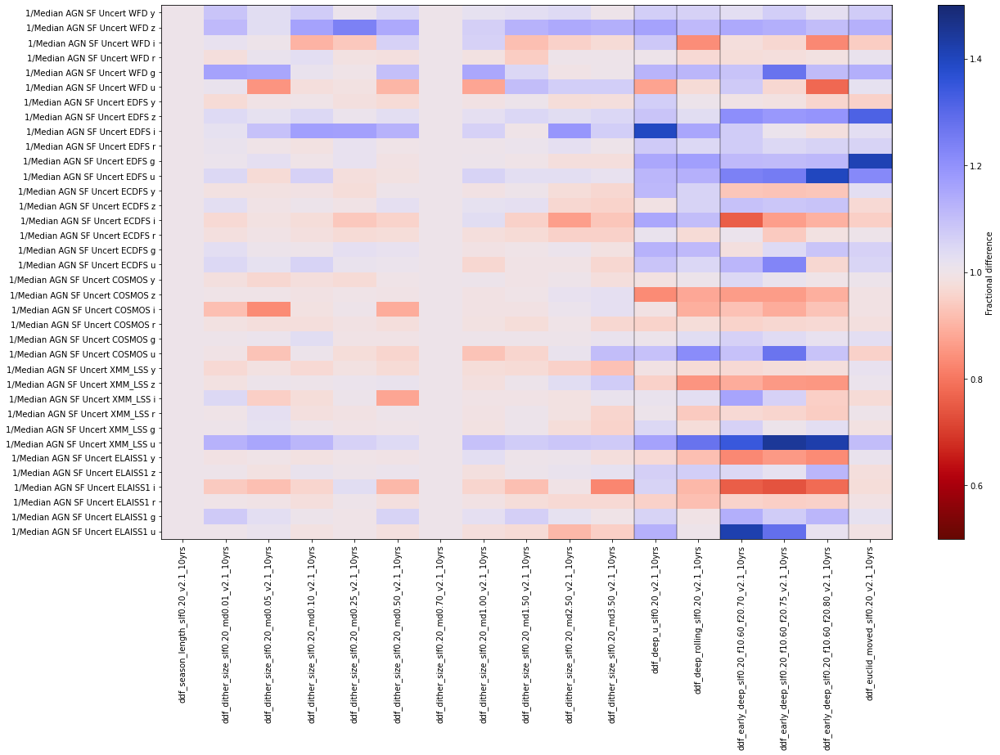

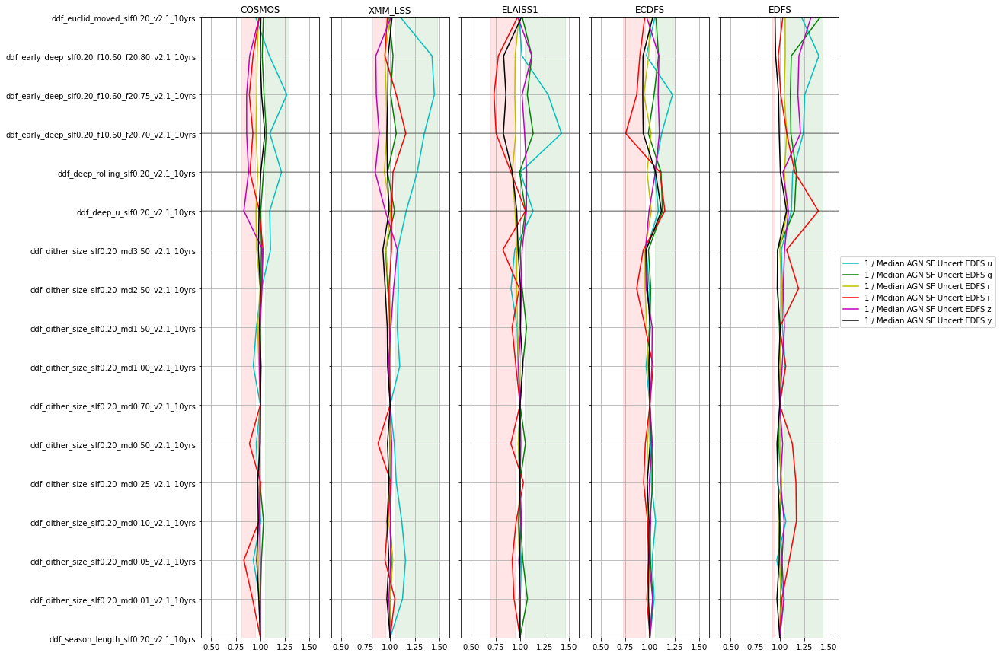

In [52]:
fams = ['ddf dither', 'ddf deep universal', 'ddf deep rolling', 'ddf early deep', 'ddf euclid moved']
baseline = 'ddf_season_length_slf0.20_v2.1_10yrs'
these_runs = np.concatenate([[baseline], families.explode(['run']).loc[fams]['run']])

fig, ax = maf.plot_run_metric_mesh(summaries.loc[these_runs, metrics['metric']],
                                  baseline_run=baseline,
                                  metric_label_map=metrics['short_name'],
                                  metric_set=metrics, 
                                  color_range=1)
fig.set_figwidth(20)
fig.set_figheight(12)
for l in (maf.find_family_lines(families, fams)+1):
    ax.axvline(l, color='k', alpha=0.3)


fig = plt.figure(figsize=(15, 15))
gs = fig.add_gridspec(ncols=5, nrows=1, wspace=0.1)
axs = gs.subplots(sharey=True)
for dd, ax  in zip(ddfs, axs):
    msubset = metrics.query('metric.str.contains(@dd)')
    fig, ax = maf.plot_run_metric(summaries.loc[these_runs, msubset['metric']],
                                      baseline_run=baseline,
                                      metric_label_map=msubset['short_name'],
                                      metric_set=msubset,
                                 horizontal_quantity='value',
                                 vertical_quantity='run',
                                 ax=ax)
    ax.get_legend().remove()
    ax.set_xlim(0.4, 1.6)
    ax.set_title(dd)
    for l in (maf.find_family_lines(families, fams)+1):
        ax.axhline(l, color='k', alpha=0.3)
ax.legend(loc=(1.01, 0.5))

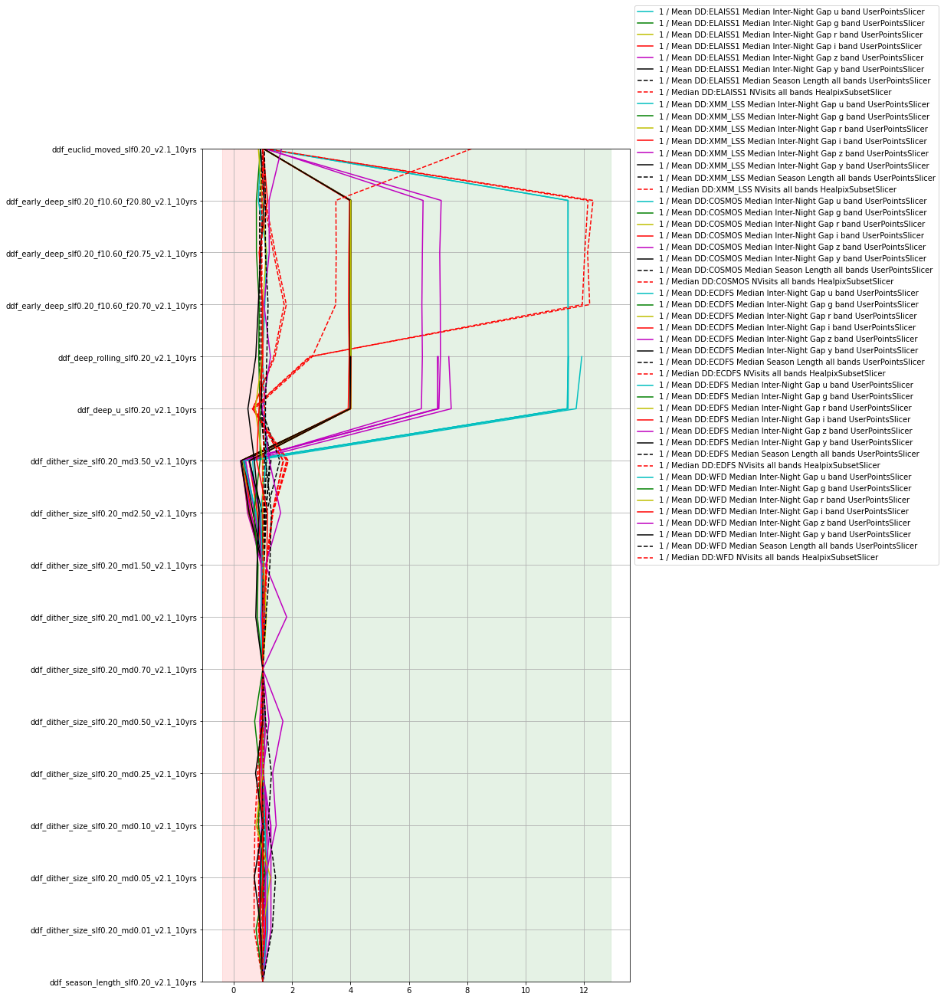

In [53]:
# Let's have a quick look at the season length, inter-night gaps, and overall number of visits and depths
fig, ax = maf.plot_run_metric(summaries.loc[these_runs, cad['metric']], 
                    baseline_run=baseline,
                   metric_set = cad)
fig.set_figheight(20)
ax.legend(loc=(1.01, 0.5))
#ax.set_xlim(0.4, 1.3)